In [120]:
import collections
from random import shuffle
import os
from os import listdir
from os.path import join

import numpy as np
from PIL import Image  # Import PIL for image decoding


def is_jpeg(filename):
    # You can customize this function to match your preferred file extension(s)
    return any(filename.endswith(extension) for extension in [".jpg", ".jpeg", ".png"])


"""def get_subdirs(directory):
    # Ensure both "frontal_file" and "profile_file" folders exist
    subdirs = [
        d
        for d in sorted(os.listdir(directory))
        if os.path.isdir(os.path.join(directory, d))
        and all(
            os.path.isdir(os.path.join(d, subfolder))
            for subfolder in ["frontal_file", "profile_file"]
        )
    ]
    return sorted(subdirs)"""
def get_subdirs(directory):
    subdirs = sorted([join(directory, name) for name in sorted(os.listdir(directory)) if os.path.isdir(os.path.join(directory, name))])
    return subdirs



flatten = lambda l: [item for sublist in l for item in sublist]


class ExternalInputIterator:
    def __init__(self, imageset_dir, batch_size, random_shuffle=False):
        self.imageset_dir = imageset_dir
        self.batch_size = batch_size

        # Get subdirectories (assuming "frontal_file" and "profile_file" folders exist)
        self.person_dirs = get_subdirs(imageset_dir)

        # Collect frontal image paths (adjust according to your data structure)
        self.frontals = np.array(
            [join(imageset_dir, frontal_file) for frontal_file in sorted(os.listdir(imageset_dir)) if is_jpeg(frontal_file)]
        )
        print(len(self.frontals))

        # Collect profile image paths (adjust according to your data structure)
        self.profile_files = [
            [
                join(person_dir, profile_file)
                for profile_file in os.listdir(person_dir)
                if is_jpeg(profile_file)
            ]
            for person_dir in self.person_dirs
        ]
        #print(len(self.profile_files))

        # Create a flattened list of frontal indices
        self.frontal_indices = np.array(
            [i for i, profiles in enumerate(self.profile_files) for _ in profiles]
        )
        print(len(self.frontal_indices ))

        # Flatten profile_files for easier access
        self.profiles = np.array(flatten(self.profile_files))
        print(len(self.profiles ))

        # Shuffle if necessary
        if random_shuffle:
            """ind = np.array(range(len(self.frontal_indices)))
            shuffle(ind)
            self.profiles = self.profiles[ind]
            self.frontal_indices = self.frontal_indices[ind]"""
            ind = np.array(range(len(self.frontal_indices)))
            shuffle(ind)
            self.profiles = self.profiles[ind.astype(int)]
            self.frontal_indices = self.frontal_indices[ind.astype(int)]


        self.i = 0
        self.n = len(self.frontal_indices)

    def __iter__(self):
        return self

    def __next__(self):
        profiles = []
        frontals = []

        for _ in range(self.batch_size):
            profile_filename = self.profiles[self.i]
            frontal_filename = self.frontals[self.frontal_indices[self.i]]
            #frontal_filename = self.frontals[self.i]
            #print(f"frontal_filename: {len(frontal_filename)}")

            with Image.open(profile_filename) as profile_img:
                profiles.append(np.array(profile_img))
            with Image.open(frontal_filename) as frontal_img:
                frontals.append(np.array(frontal_img))

            self.i = (self.i + 1) % self.n

        return (profiles, frontals)

class ImagePipeline:
    def __init__(self, imageset_dir, image_size=128, random_shuffle=False, batch_size=64, num_threads=2, device_id=0):
        self.eii = ExternalInputIterator(imageset_dir, batch_size, random_shuffle)
        self.iterator = iter(self.eii)
        self.num_inputs = len(self.eii.frontal_indices)
        self.image_size = image_size

    def epoch_size(self, name=None):
        return self.num_inputs

    def __len__(self):
        return self.num_inputs

    def __iter__(self):
        return self

    def __next__(self):
        (images, targets) = next(self.iterator)

        # Perform resizing and normalization using NumPy
        resized_images = np.array([np.array(Image.fromarray(img).resize((self.image_size, self.image_size))) for img in images])
        resized_targets = np.array([np.array(Image.fromarray(target).resize((self.image_size, self.image_size))) for target in targets])

        # Normalize using mean and standard deviation
        normalized_images = (resized_images - 128.0) / 128.0
        normalized_targets = (resized_targets - 128.0) / 128.0

        return (normalized_images, normalized_targets)

    def __getitem__(self, index):  # Added __getitem__ method
        # Advance the iterator to the desired index
        for _ in range(index):
            next(self.iterator)

        # Return the next batch
        return next(self)


In [121]:
x = ExternalInputIterator(imageset_dir=r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file",batch_size=32)

12
492
492


In [3]:
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
from torch.autograd import Variable


def weights_init(m):
    classname = m.__class__.__name__
    
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)


''' Generator network for 128x128 RGB images '''
class G(nn.Module):
    
    def __init__(self):
        super(G, self).__init__()
        
        self.main = nn.Sequential(
            # Input HxW = 128x128
            nn.Conv2d(3, 16, 4, 2, 1), # Output HxW = 64x64
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, 4, 2, 1), # Output HxW = 32x32
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.Conv2d(32, 64, 4, 2, 1), # Output HxW = 16x16
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 128, 4, 2, 1), # Output HxW = 8x8
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.Conv2d(128, 256, 4, 2, 1), # Output HxW = 4x4
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.Conv2d(256, 512, 4, 2, 1), # Output HxW = 2x2
            nn.MaxPool2d((2,2)),
            # At this point, we arrive at our low D representation vector, which is 512 dimensional.

            nn.ConvTranspose2d(512, 256, 4, 1, 0, bias = False), # Output HxW = 4x4
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias = False), # Output HxW = 8x8
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias = False), # Output HxW = 16x16
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias = False), # Output HxW = 32x32
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 16, 4, 2, 1, bias = False), # Output HxW = 64x64
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 3, 4, 2, 1, bias = False), # Output HxW = 128x128
            nn.Tanh()
        )

    
    def forward(self, input):
        output = self.main(input)
        return output


''' Discriminator network for 128x128 RGB images '''
class D(nn.Module):
    
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                                  nn.Conv2d(3, 16, 4, 2, 1),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(16, 32, 4, 2, 1),
                                  nn.BatchNorm2d(32),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(32, 64, 4, 2, 1),
                                  nn.BatchNorm2d(64),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(64, 128, 4, 2, 1),
                                  nn.BatchNorm2d(128),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(128, 256, 4, 2, 1),
                                  nn.BatchNorm2d(256),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(256, 512, 4, 2, 1),
                                  nn.BatchNorm2d(512),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(512, 1, 4, 2, 1, bias = False),
                                  nn.Sigmoid()
                                  )
    
    
    def forward(self, input):
        output = self.main(input)
        return output.view(-1)

In [ ]:
from __future__ import print_function
import time
import math
import random
import os
from os import listdir
from os.path import join
from PIL import Image

import numpy as np
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torchvision.utils as vutils
from torch.autograd import Variable
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm

#from nvidia.dali.plugin.pytorch import DALIGenericIterator

#from data import ImagePipeline
#import network

np.random.seed(42)
random.seed(10)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.manual_seed(999)
torch.cuda.manual_seed(999)
# Where is your training dataset at?
datapath = r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file"

# You can also choose which GPU you want your model to be trained on below:
gpu_id = 0
device = torch.device("cuda", gpu_id)

"""train_pipe = ImagePipeline(datapath, image_size=128, random_shuffle=True, batch_size=30, device_id=gpu_id)
train_pipe.build()
m_train = train_pipe.epoch_size()
print("Size of the training set: ", m_train)
train_pipe_loader = DALIGenericIterator(train_pipe, ["profiles", "frontals"], m_train)"""
# Assuming you have the modified ImagePipeline class from the previous responses
train_pipe = ImagePipeline(datapath, image_size=128, random_shuffle=True, batch_size=32, device_id=gpu_id)
# No need to call build() without DALI

# Use a standard PyTorch DataLoader instead of DALIGenericIterator
#train_pipe_loader = DataLoader(train_pipe, batch_size=train_pipe.batch_size)
m_train = train_pipe.epoch_size()
#train_pipe_loader = DataLoader(train_pipe, batch_size=32,)
train_pipe_loader = DataLoader(train_pipe,)
# Generator:
#netG = network.G().to(device)
#netG.apply(network.weights_init)
netG = G().to(device)
netG.apply(weights_init)

# Discriminator:
#netD = network.D().to(device)
#netD.apply(network.weights_init)
netD = D().to(device)
netD.apply(weights_init)

# Here is where you set how important each component of the loss function is:
L1_factor = 0
L2_factor = 1
GAN_factor = 0.0005

criterion = nn.BCELoss() # Binary cross entropy loss

# Optimizers for the generator and the discriminator (Adam is a fancier version of gradient descent with a few more bells and whistles that is used very often):
optimizerD = optim.Adam(netD.parameters(), lr = 0.0002, betas = (0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr = 0.0002, betas = (0.5, 0.999), eps = 1e-8)

# Create a directory for the output files
try:
    os.mkdir('output')
except OSError:
    pass

start_time = time.time()

# Let's train for 30 epochs (meaning, we go through the entire training set 30 times):
for epoch in range(20):
    
    # Lets keep track of the loss values for each epoch:
    loss_L1 = 0
    loss_L2 = 0
    loss_gan = 0
    
    # Your train_pipe_loader will load the images one batch at a time
    # The inner loop iterates over those batches:
    print("starting...")
    with tqdm(total=len(train_pipe_loader), desc=f"Epoch {epoch+1}") as pbar:
        for i, data in enumerate(train_pipe_loader, 0):
        
        # These are your images from the current batch:
        #profile = data[0]['profiles']
        #frontal = data[0]['frontals']
            profile = data[0].view(32, 3, 128, 128)
            frontal = data[1].view(32, 3, 128, 128)
        
        
        # TRAINING THE DISCRIMINATOR
            netD.zero_grad()
            real = Variable(frontal).type('torch.FloatTensor').to(device)
            target = Variable(torch.ones(real.size()[0])).to(device)
            output = netD(real)
        # D should accept the GT images
            errD_real = criterion(output, target)
        
            profile = Variable(profile).type('torch.FloatTensor').to(device)
            generated = netG(profile)
            target = Variable(torch.zeros(real.size()[0])).to(device)
            output = netD(generated.detach()) # detach() because we are not training G here

            pbar.update(1)
        
        # D should reject the synthetic images
            errD_fake = criterion(output, target)
        
            errD = errD_real + errD_fake
            errD.backward()
        # Update D
            optimizerD.step()
        
        # TRAINING THE GENERATOR
            netG.zero_grad()
            target = Variable(torch.ones(real.size()[0])).to(device)
            output = netD(generated)
        
        # G wants to :
        # (a) have the synthetic images be accepted by D (= look like frontal images of people)
            errG_GAN = criterion(output, target)
        
        # (b) have the synthetic images resemble the ground truth frontal image
            errG_L1 = torch.mean(torch.abs(real - generated))
            errG_L2 = torch.mean(torch.pow((real - generated), 2))
        
            errG = GAN_factor * errG_GAN + L1_factor * errG_L1 + L2_factor * errG_L2
        
            loss_L1 += errG_L1.item()
            loss_L2 += errG_L2.item()
            loss_gan += errG_GAN.item()
        
            errG.backward()
        # Update G
            optimizerG.step()
    
    if epoch == 0:
        print('First training epoch completed in ',(time.time() - start_time),' seconds')
    if epoch > 0:
        print(f"Epoch: {epoch} is starting..")
    # reset the DALI iterator
    #train_pipe_loader.reset()

    # Print the absolute values of three losses to screen:
    print('[%d/30] Training absolute losses: L1 %.7f ; L2 %.7f BCE %.7f' % ((epoch + 1), loss_L1/m_train, loss_L2/m_train, loss_gan/m_train,))

    # Save the inputs, outputs, and ground truth frontals to files:
    vutils.save_image(profile.data, 'output/%03d_input.jpg' % epoch, normalize=True)
    vutils.save_image(real.data, 'output/%03d_real.jpg' % epoch, normalize=True)
    vutils.save_image(generated.data, 'output/%03d_generated.jpg' % epoch, normalize=True)

    

    # Save the pre-trained Generator as well
    torch.save(netG,'output/netG_%d.pt' % epoch)

12
480
480
starting...


Epoch 1: 100%|█████████████████████████████████████████████████████████████████████| 480/480 [1:31:11<00:00, 11.40s/it]


First training epoch completed in  5471.691112041473  seconds
[1/30] Training absolute losses: L1 0.1400575 ; L2 0.0391489 BCE 4.3940077
starting...


Epoch 2: 100%|█████████████████████████████████████████████████████████████████████| 480/480 [1:31:47<00:00, 11.47s/it]


Epoch: 1 is starting..
[2/30] Training absolute losses: L1 0.0768089 ; L2 0.0101298 BCE 3.8710009
starting...


Epoch 3: 100%|█████████████████████████████████████████████████████████████████████| 480/480 [1:31:42<00:00, 11.46s/it]


Epoch: 2 is starting..
[3/30] Training absolute losses: L1 0.0753963 ; L2 0.0095343 BCE 3.8293384
starting...


Epoch 4: 100%|█████████████████████████████████████████████████████████████████████| 480/480 [1:31:33<00:00, 11.45s/it]


Epoch: 3 is starting..
[4/30] Training absolute losses: L1 0.0739834 ; L2 0.0091149 BCE 3.8813169
starting...


Epoch 5: 100%|█████████████████████████████████████████████████████████████████████| 480/480 [1:31:05<00:00, 11.39s/it]


Epoch: 4 is starting..
[5/30] Training absolute losses: L1 0.0759287 ; L2 0.0095699 BCE 4.0629253
starting...


Epoch 6: 100%|█████████████████████████████████████████████████████████████████████| 480/480 [1:33:36<00:00, 11.70s/it]


Epoch: 5 is starting..
[6/30] Training absolute losses: L1 0.0763663 ; L2 0.0096565 BCE 4.4609655
starting...


Epoch 7:  59%|██████████████████████████████████████████▏                            | 285/480 [53:50<43:16, 13.32s/it]

**NEXT**

In [35]:
import collections
from random import shuffle
import os
from os import listdir
from os.path import join

import numpy as np
from PIL import Image  # Import PIL for image decoding


def is_jpeg(filename):
  # You can customize this function to match your preferred file extension(s)
  return any(filename.endswith(extension) for extension in [".jpg", ".jpeg", ".png"])


def get_subdirs(directory):
  """Gets subdirectories within the dataset directory.

  Args:
      directory: Path to the dataset directory.

  Returns:
      A list of subdirectory paths within the dataset directory.
  """
  subdirs = sorted([join(directory, name) for name in sorted(listdir(directory)) if os.path.isdir(join(directory, name))])
  return subdirs


def flatten(l):
  return [item for sublist in l for item in sublist]


class ExternalInputIterator:
  def __init__(self, imageset_dir, batch_size, random_shuffle=False):
    self.imageset_dir = imageset_dir
    self.batch_size = batch_size

    # Get subdirectories
    self.person_dirs = get_subdirs(imageset_dir)

    # Collect frontal image paths
    self.frontals = np.array([
        join(self.imageset_dir, frontal_file)
        for frontal_file in sorted(listdir(self.imageset_dir))
        if is_jpeg(frontal_file)
    ])
    
    print(len(self.frontals))
    print(self.frontals[11])

    # Collect profile image paths
    self.profile_files = [
        [
            join(person_dir, profile_file)
            for profile_file in listdir(person_dir)
            if is_jpeg(profile_file)
        ]
        for person_dir in self.person_dirs
    ]
    #print(self.profile_files)
    # Create a flattened list of frontal indices
    self.frontal_indices = np.array([i for i, profiles in enumerate(self.profile_files) for _ in profiles])
    print(len(self.frontal_indices ))
    print(self.frontal_indices )

    """frontal_ind = []
    for ind, profiles in enumerate(self.profile_files):
        frontal_ind += [ind]*len(profiles)
    self.frontal_indices = np.array(frontal_ind)
    print(len(self.frontal_indices ))
    print(self.frontal_indices )"""

      
    # Flatten profile_files for easier access
    self.profiles = np.array(flatten(self.profile_files))
    print(len(self.profiles))
    print(self.profiles[0][11])
    # Shuffle if necessary
    if random_shuffle:
      ind = np.array(range(len(self.frontal_indices)))
      shuffle(ind)
      self.profiles = self.profiles[ind.astype(int)]
      self.frontal_indices = self.frontal_indices[ind.astype(int)]

    self.i = 0
    self.n = len(self.frontal_indices)

  def __iter__(self):
    return self

  def __next__(self):
    profiles = []
    frontals = []

    for _ in range(self.batch_size):
      profile_filename = self.profiles[self.i]
      frontal_filename = self.frontals[self.frontal_indices[self.i]]

      with Image.open(profile_filename) as profile_img:
        profiles.append(np.array(profile_img))
      with Image.open(frontal_filename) as frontal_img:
        frontals.append(np.array(frontal_img))

      self.i = (self.i + 1) % self.n

    return (profiles, frontals)


class ImagePipeline:
  def __init__(self, imageset_dir, image_size=128, random_shuffle=False, batch_size=64, num_threads=2, device_id=0):
    self.eii = ExternalInputIterator(imageset_dir, batch_size, random_shuffle)
    self.iterator = iter(self.eii)
    self.num_inputs = len(self.eii.frontal_indices)
    self.image_size = image_size

  def epoch_size(self, name=None):
    return self.num_inputs

  def __len__(self):
    return self.num_inputs

  def __iter__(self):
    return self

  def __next__(self):
    (images, targets) = next(self.iterator)

    # Perform resizing and normalization using NumPy
    
    resized_images = np.array([np.array(Image.fromarray(img).resize((self.image_size, self.image_size))) for img in images])
    resized_targets = np.array([np.array(Image.fromarray(target).resize((self.image_size, self.image_size))) for target in targets])

    # Normalize using mean and standard deviation (replace with your normalization factors)
    normalized_images = (resized_images - image_mean) / image_std  # Replace with your image mean and standard deviation
    normalized_targets = (resized_targets - image_mean) / image_std  # Replace with your image mean and standard deviation

    return (normalized_images, normalized_targets)

  def __getitem__(self, index):  # Added __getitem__ method
    # Advance the iterator to the desired index
    for _ in range(index):
      next(self.iterator)

    # Return the next batch
    return next(self)


In [36]:
x = ExternalInputIterator(imageset_dir=r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file",batch_size=32)

12
C:\Users\zed\Dataset\Dataset with frontal\frontal_file\012_01_01_051_08_crop_128.png
480
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  7  7  7  7  7  7  7  7
  7  7  7  7  7  7  7  7  7  7  

In [8]:
import torch
import torchvision.utils as vutils
from torch.utils.data import DataLoader


#from data import ImagePipeline  # Assuming this custom class still exists

device = 'cuda'
datapath = r'C:\Users\zed\Dataset\CAS-PEAL-R1\test_data\fr_2'

# Generate frontal images from the test set
def frontalize(model, datapath, mtest):
    
    test_pipe = ImagePipeline(datapath, image_size=128, random_shuffle=False)  # Removed batch_size
    test_pipe_loader = DataLoader(test_pipe, batch_size=mtest)  # Use DataLoader

    with torch.no_grad():
        for data in test_pipe_loader:
             
            profile = data[0].to(device).type(torch.float)  # Correct syntax to change data type
            print(profile.shape)
            profile = profile.view(64, 3, 128, 128) 
            print(profile.shape)
            generated = model(profile).type(torch.float)  # Convert output to float

            #profile = data[0].to(device)  # Assuming profiles are in data['profiles']
            #print("length:",len(profile))
            #generated = model(profile)
            vutils.save_image(torch.cat((profile, generated.data)), 'output/test.jpg', nrow=8, padding=2, normalize=True)  # Removed frontal for consistency

# Load a pre-trained Pytorch model
saved_model = torch.load("output/netG_2.pt")

frontalize(saved_model, datapath, 1)


2
2
2
torch.Size([1, 64, 128, 128, 3])
torch.Size([64, 3, 128, 128])
torch.Size([1, 64, 128, 128, 3])
torch.Size([64, 3, 128, 128])


12
C:\Users\zed\Dataset\Dataset with frontal\frontal_file\frontal_001.png
482
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  7  7  7  7  7  7
  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7 

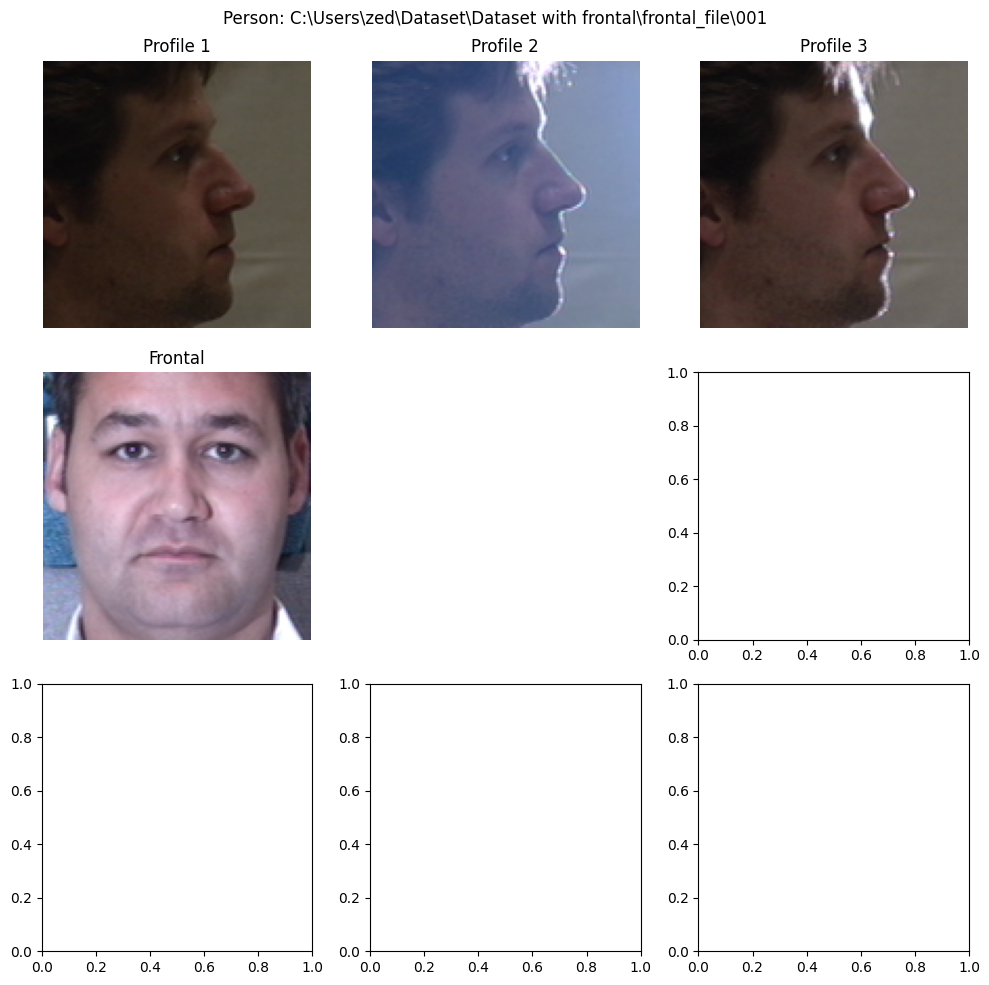

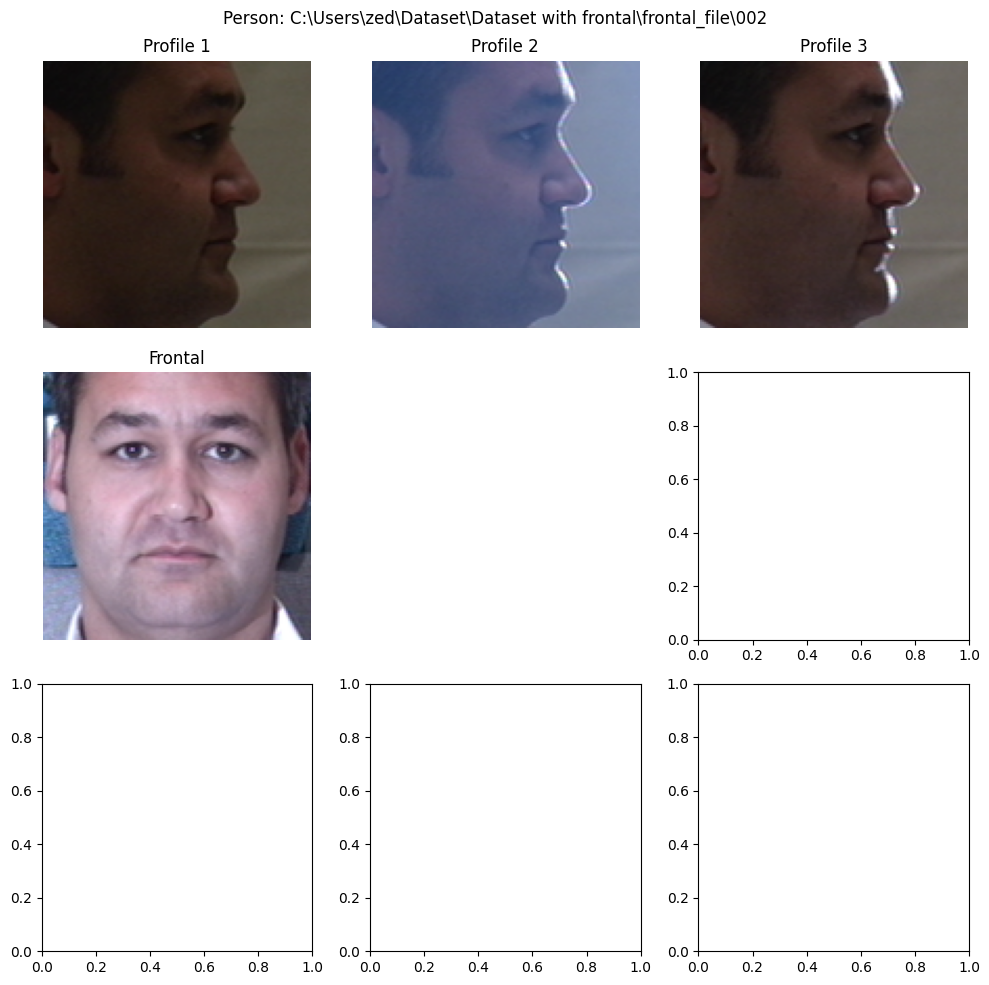

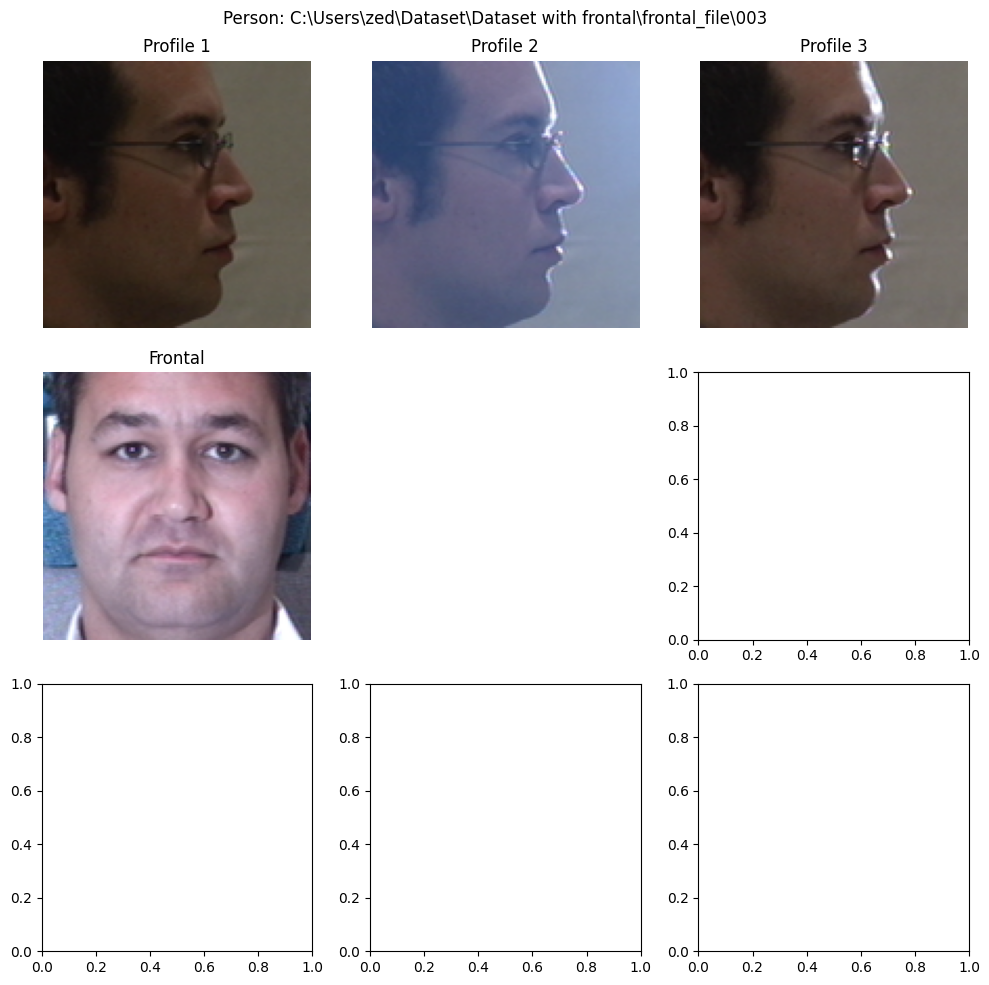

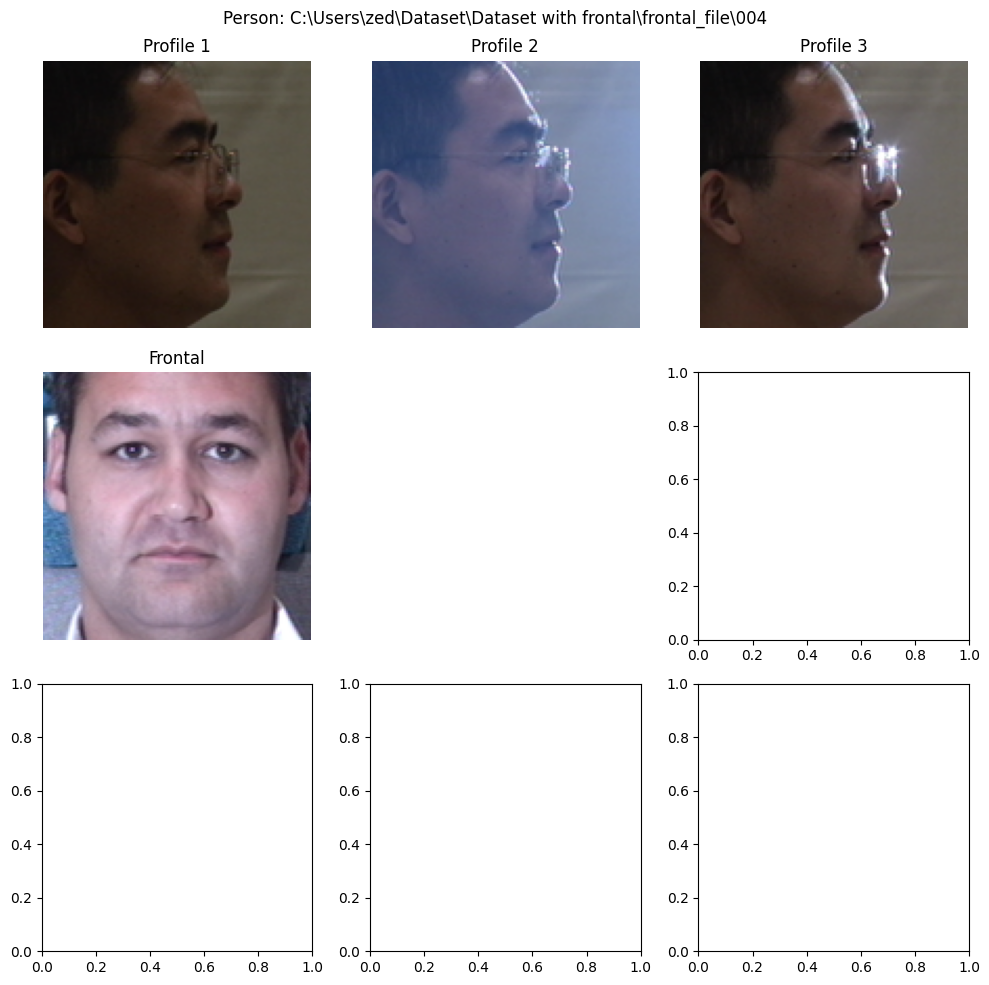

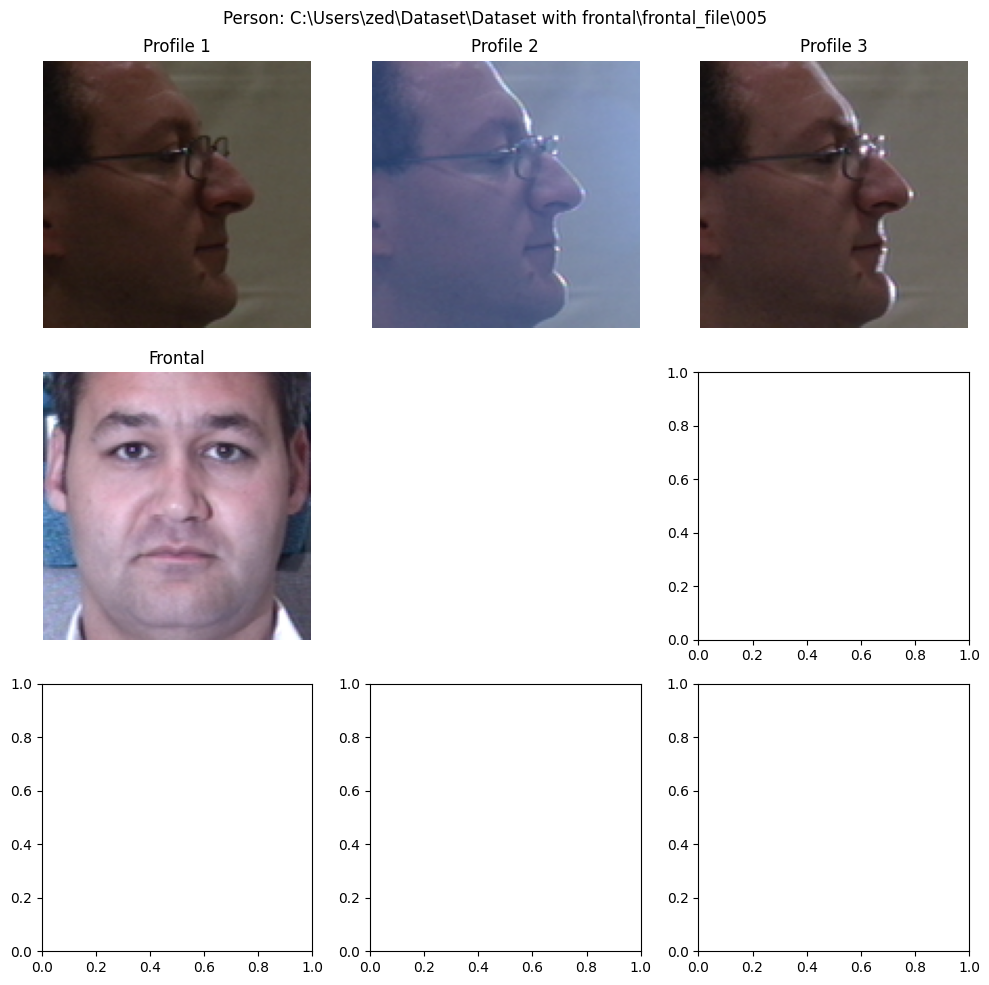

...

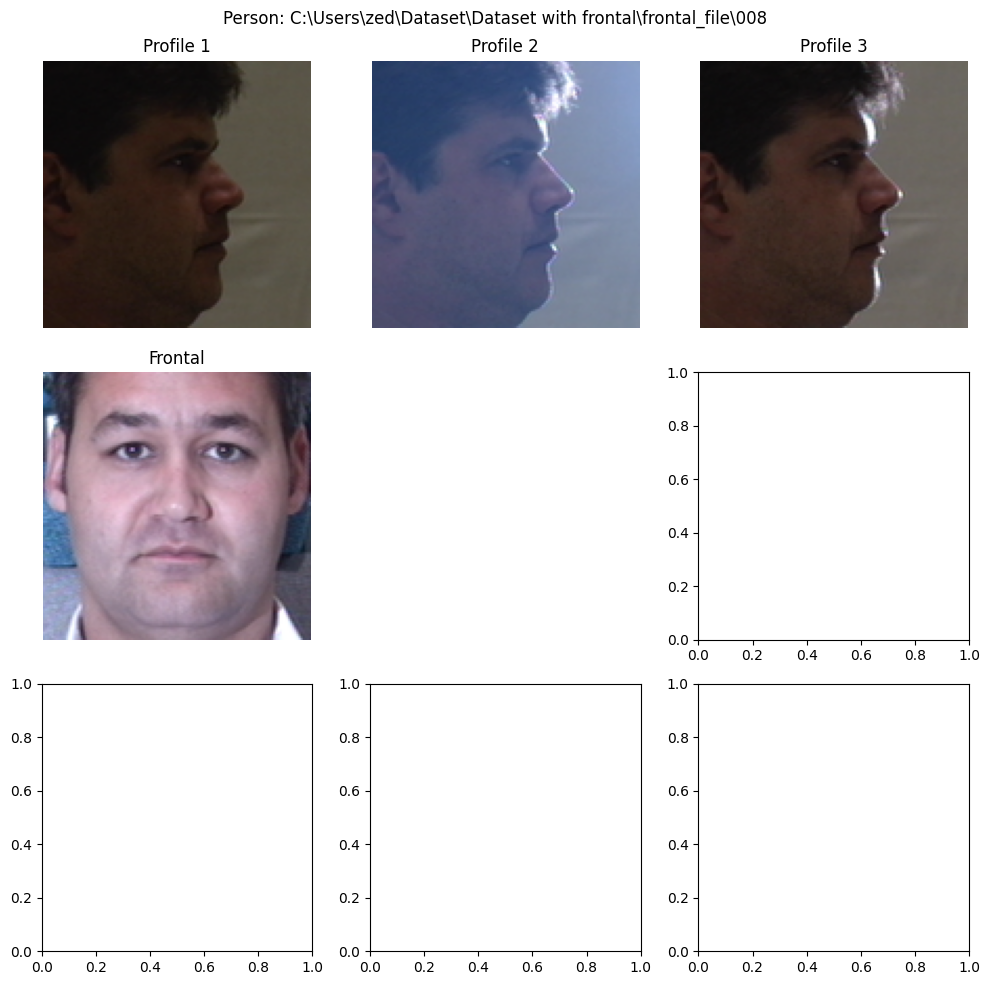

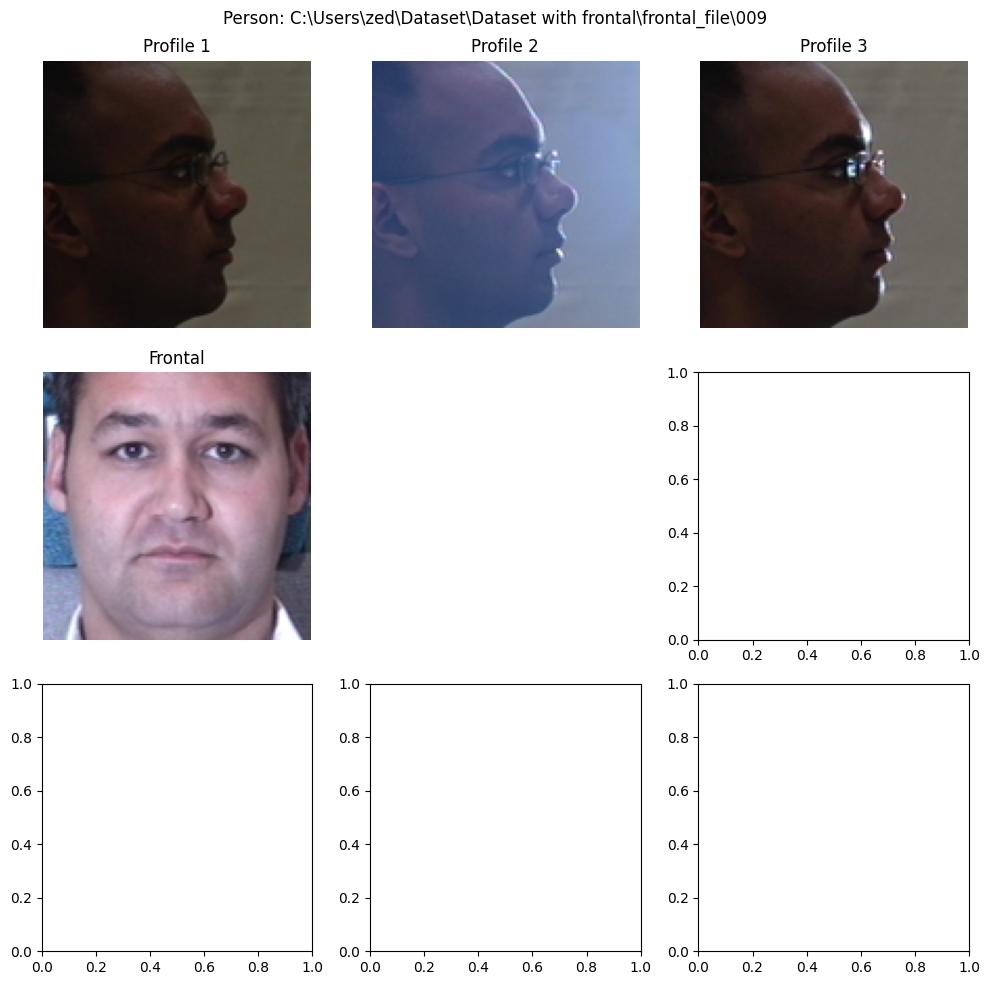

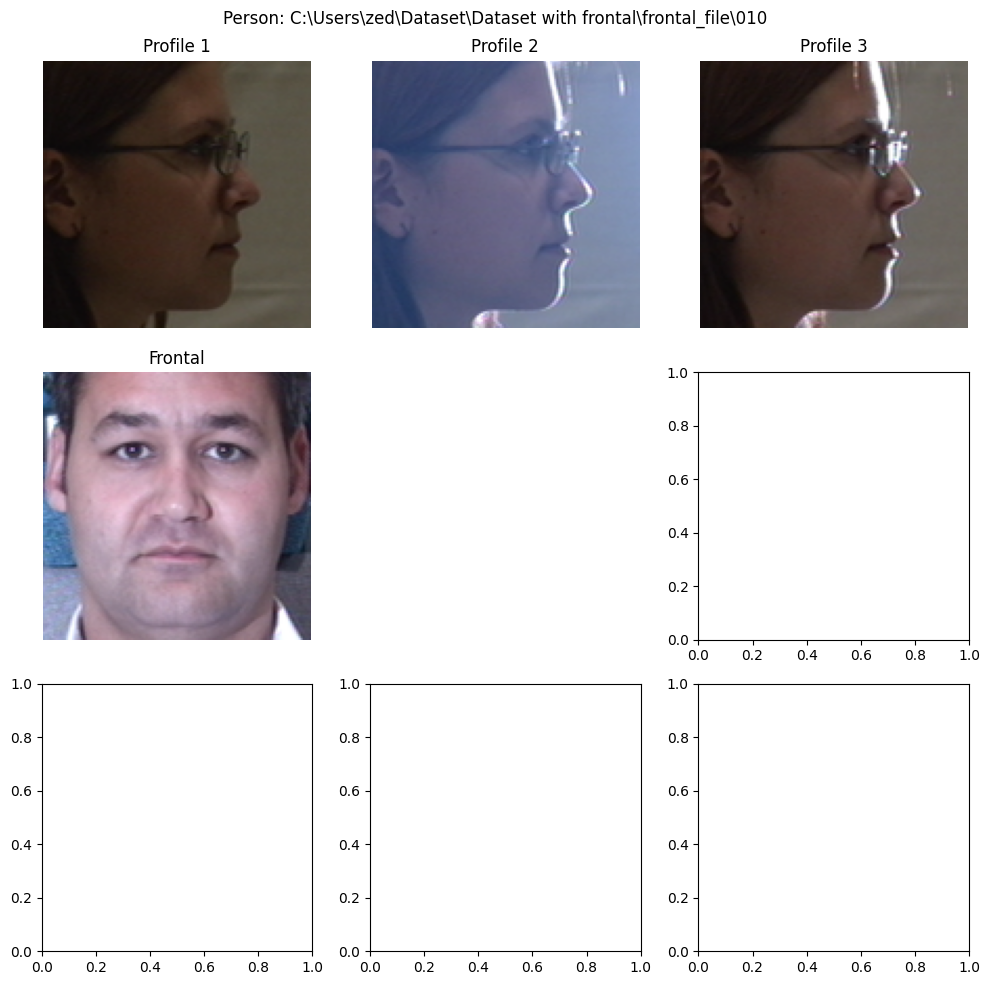

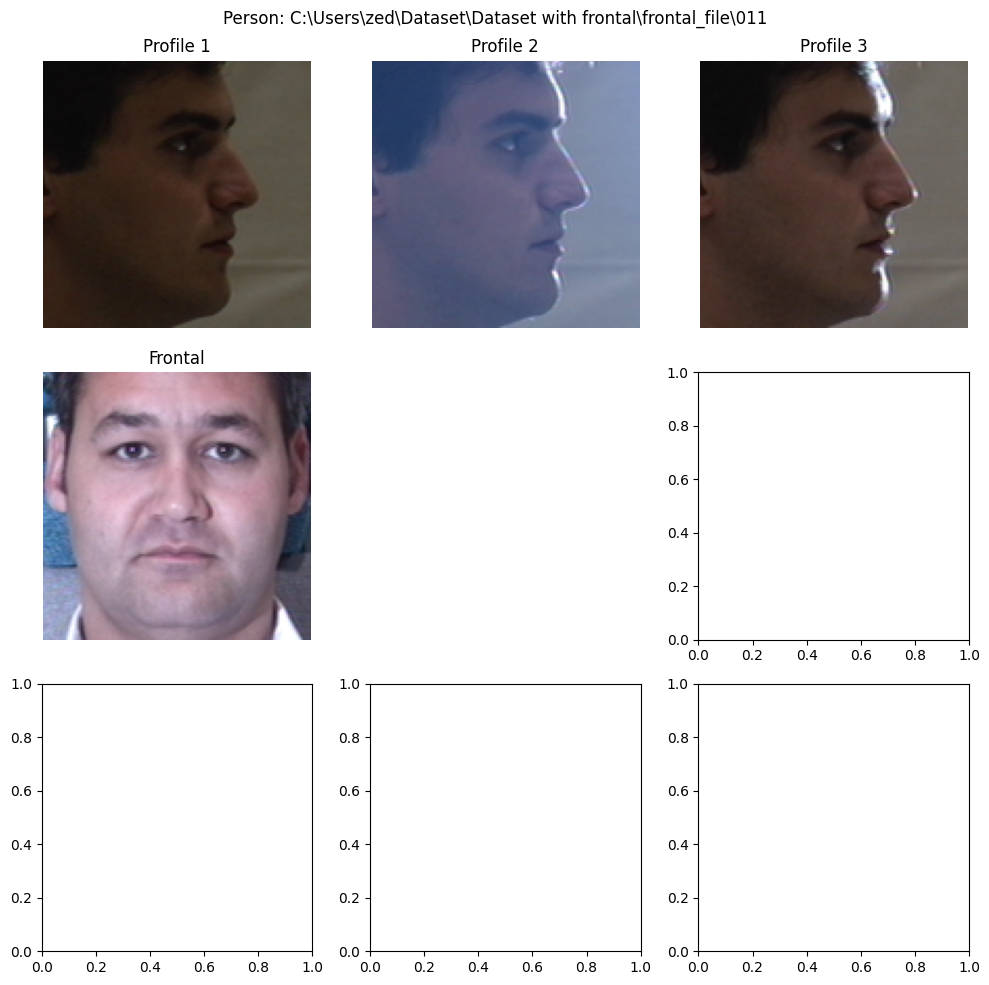

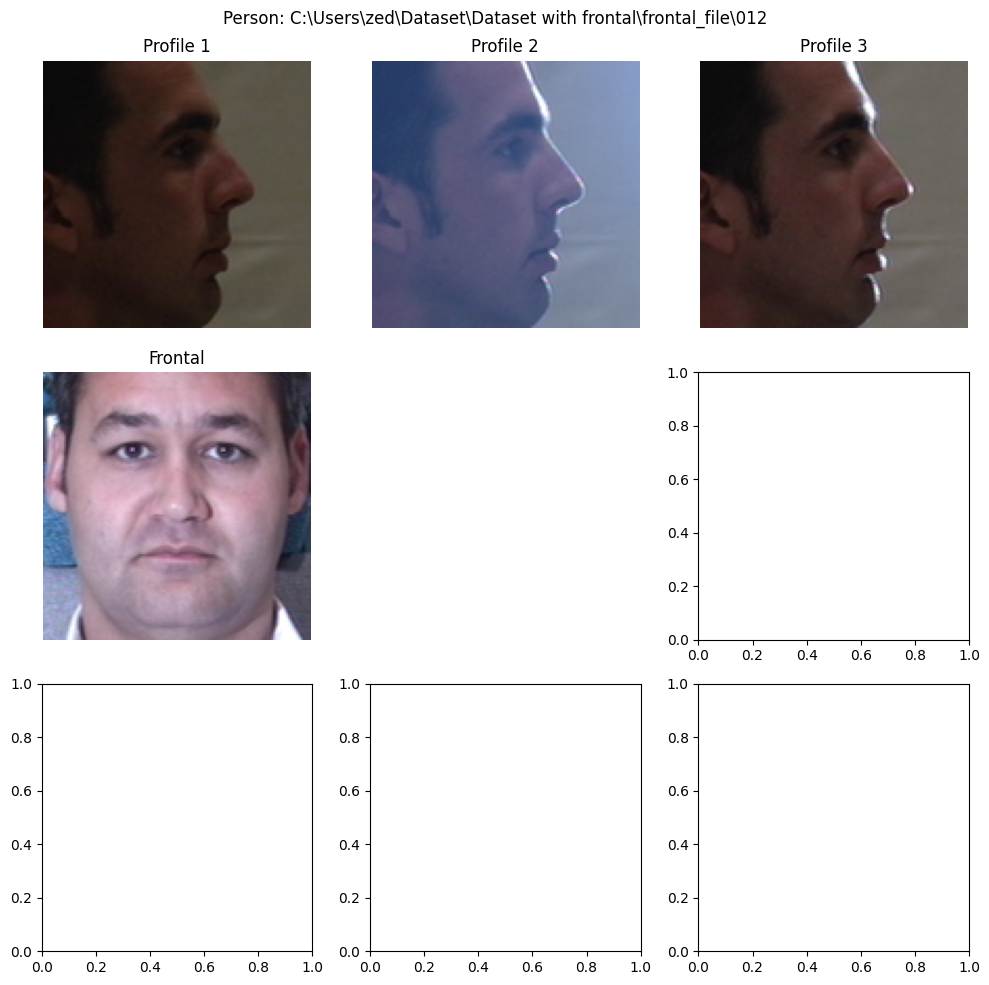

In [91]:
import matplotlib.pyplot as plt
#from your_dataset_path import ImagePipeline  # Replace with your actual dataset path

# Define number of profile images to display
num_profile_images = 3

# Create ImagePipeline object
dataset_path = r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file"  # Replace with your actual dataset path
iterator = ExternalInputIterator(dataset_path,batch_size=32)

for person_dir in iterator.person_dirs:
  # Get profile and frontal image paths for this person
  profile_files = [f for f in os.listdir(person_dir) if f.endswith((".jpg", ".jpeg", ".png"))][:num_profile_images]
  frontal_path = [f for f in os.listdir(dataset_path) if f.endswith((".jpg", ".jpeg", ".png"))][0]  # Assuming only one frontal image per person
  frontal_path = os.path.join(dataset_path, frontal_path)

  # Load and display images
  fig, axes = plt.subplots(3, 3, figsize=(10, 10))

  # Display profile images
    
  for i, profile_file in enumerate(profile_files):
    profile_path = os.path.join(person_dir, profile_file)
    profile_img = plt.imread(profile_path)
    axes[0, i].imshow(profile_img)
    axes[0, i].set_title(f"Profile {i+1}")
    axes[0, i].axis("off")

  # Display frontal image
  frontal_img = plt.imread(frontal_path)
  axes[1, 0].imshow(frontal_img)
  axes[1, 0].set_title("Frontal")
  axes[1, 0].axis("off")

  # Remove extra empty subplot
  axes[1, 1].axis("off")

  # Display the figure
  plt.suptitle(f"Person: {person_dir.split('/')[-1]}")  # Get person name from directory name
  plt.tight_layout()
  plt.show()
  plt.close(fig)


12
C:\Users\zed\Dataset\Dataset with frontal\frontal_file\012.png
482
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  7  7  7  7  7  7
  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7

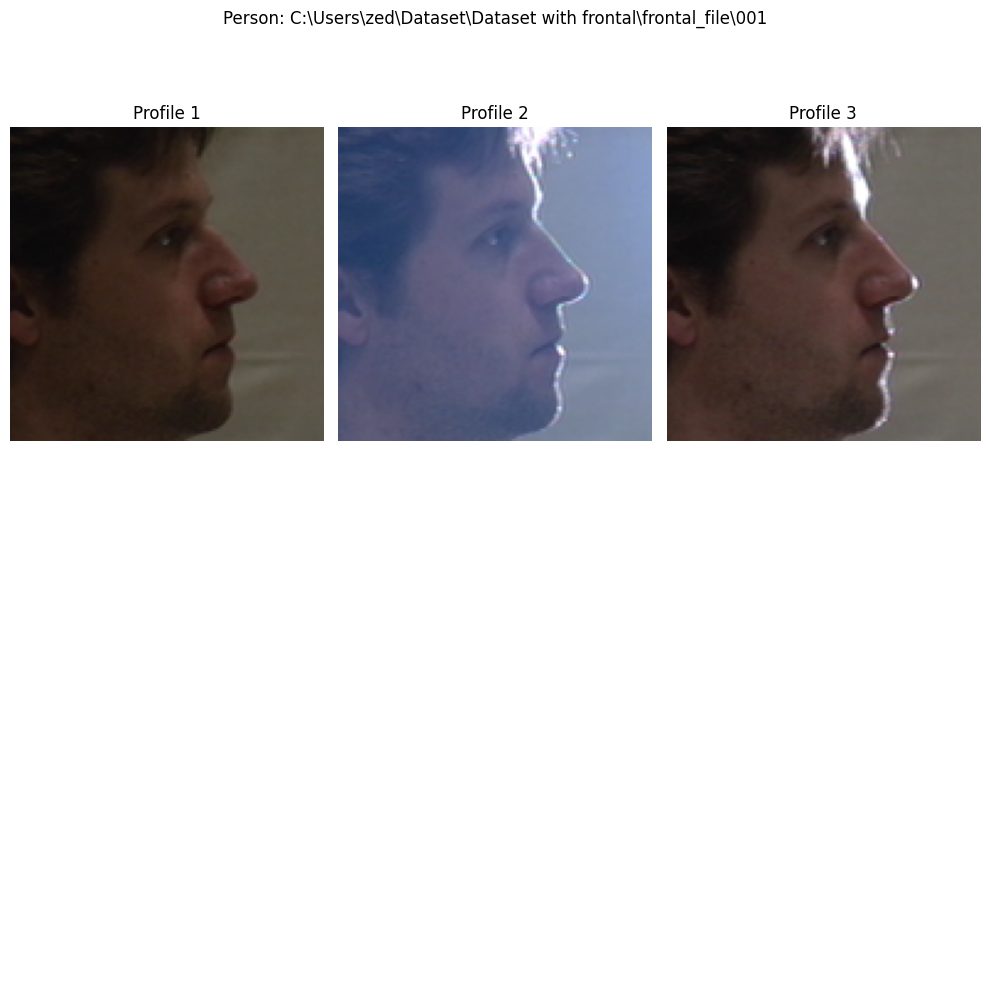

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\002\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\002\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\002\\frontal_128']


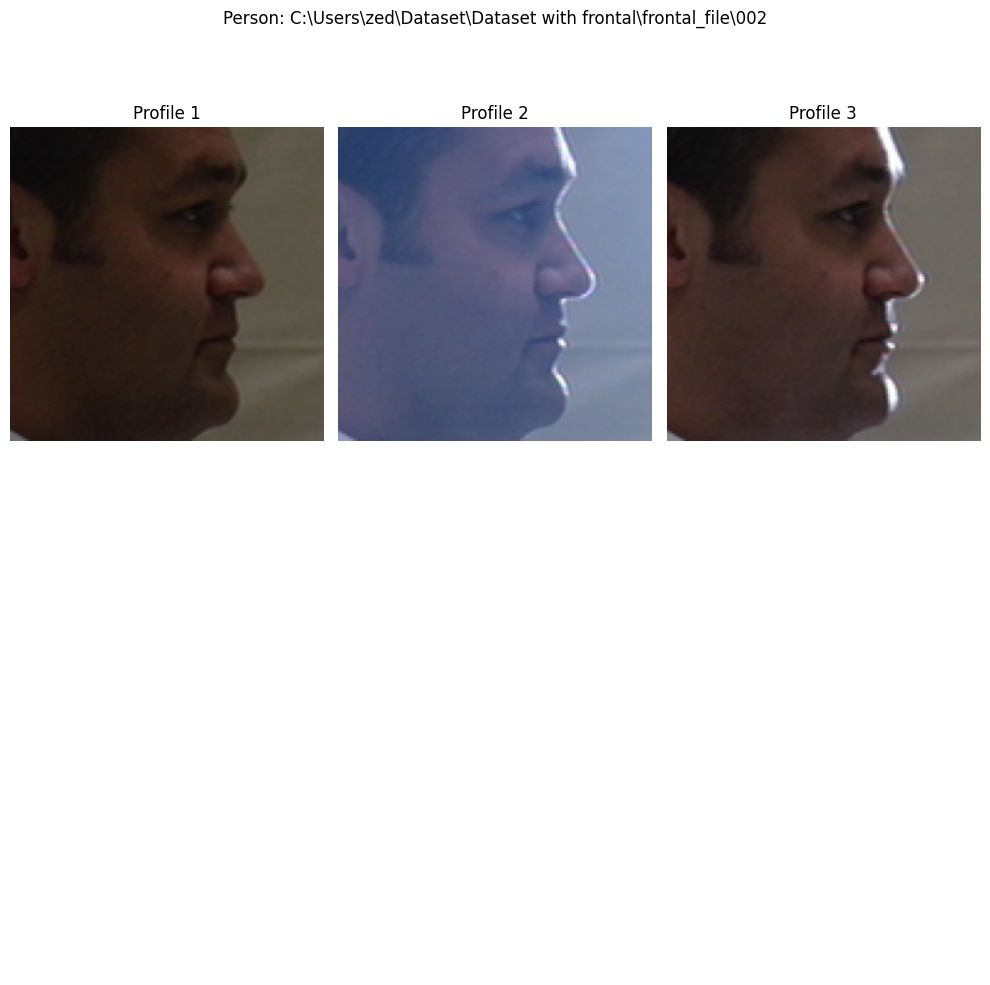

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\003\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\003\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\003\\frontal_128']


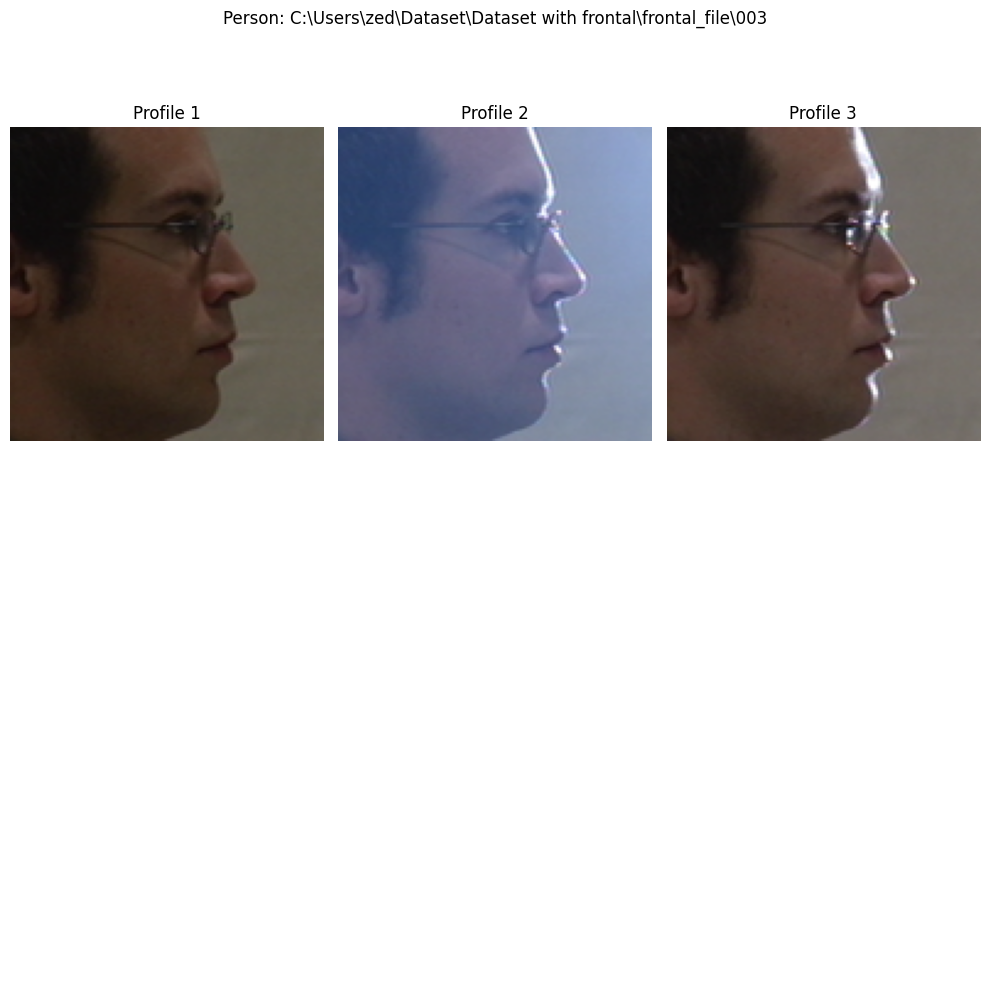

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\004\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\004\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\004\\frontal_128']


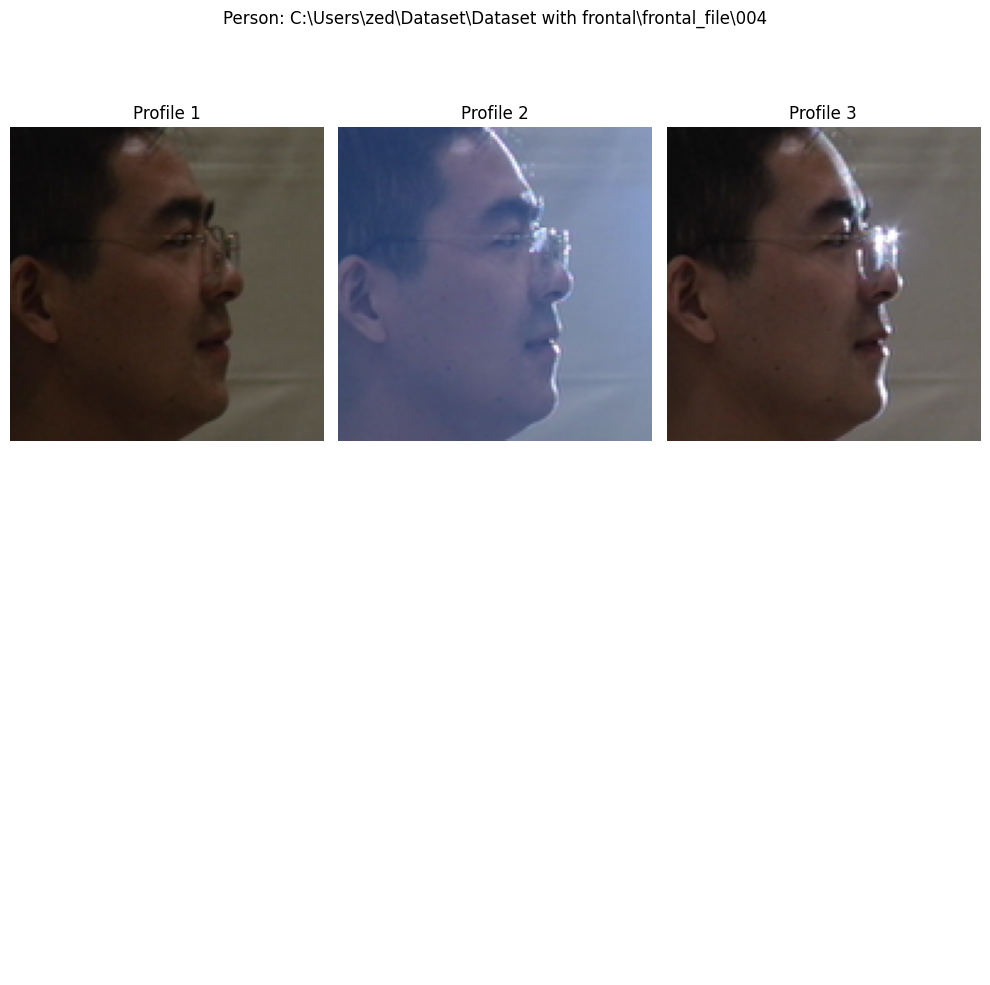

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\005\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\005\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\005\\frontal_128']


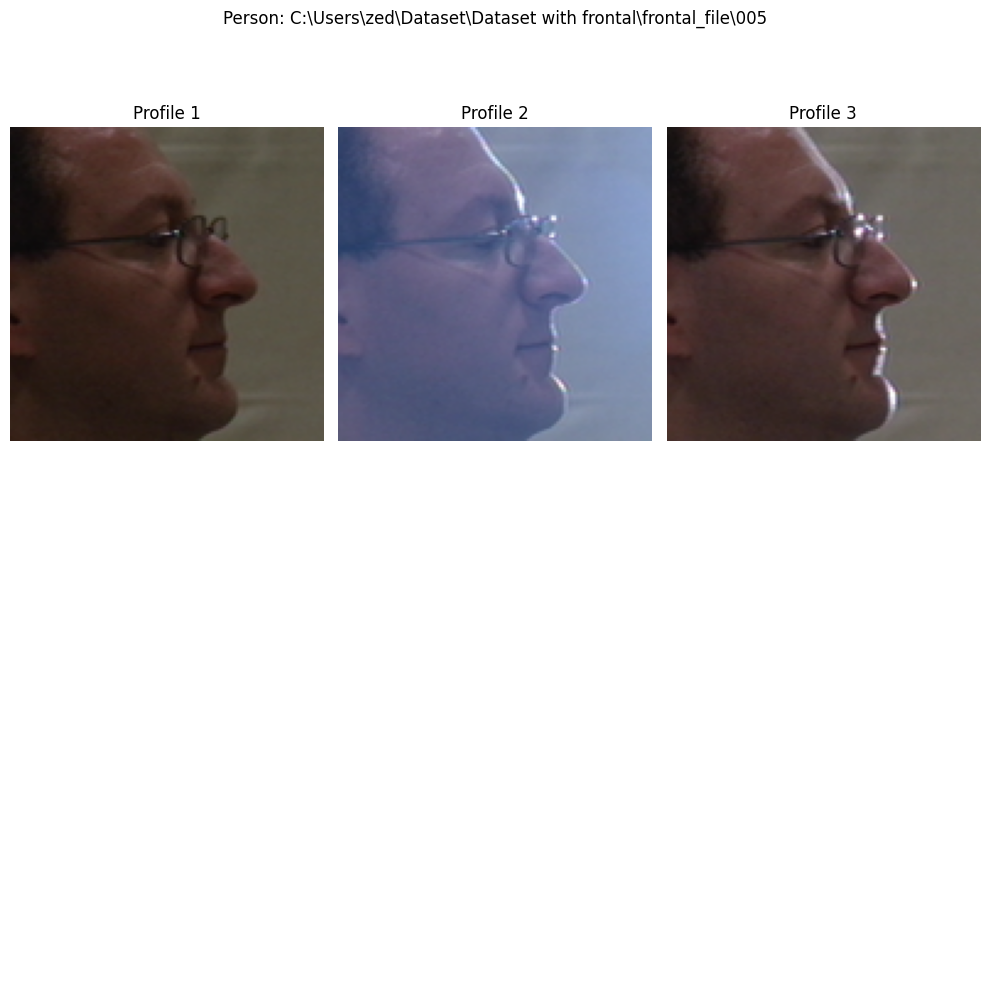

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\006\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\006\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\006\\frontal_128']


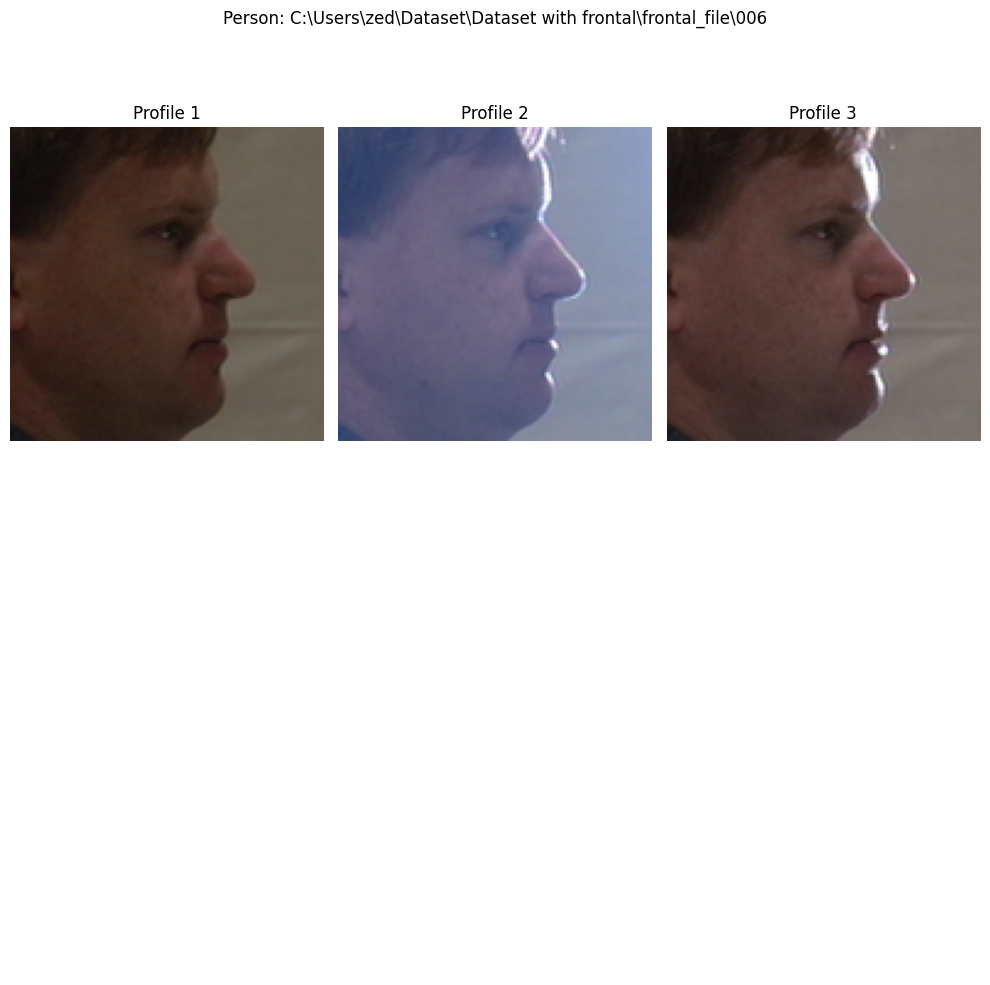

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\007\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\007\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\007\\frontal_128']


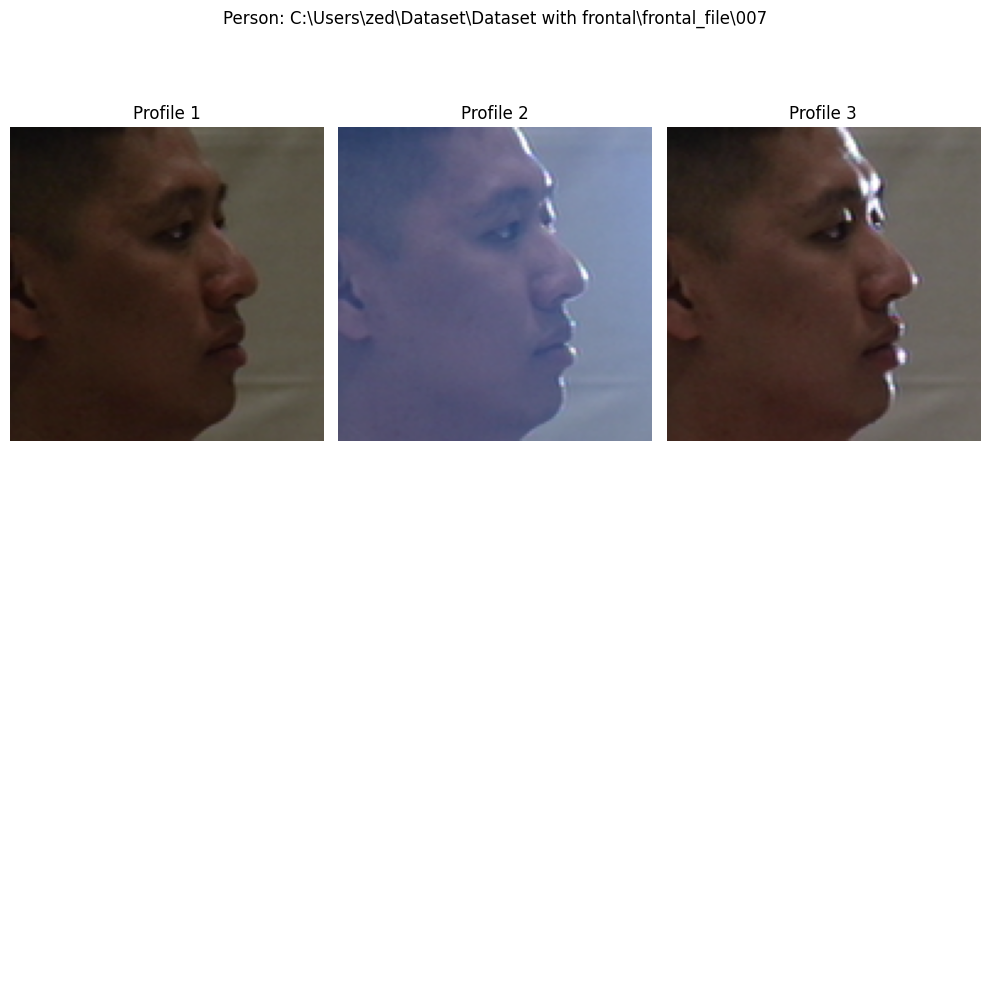

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\008\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\008\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\008\\frontal_128']


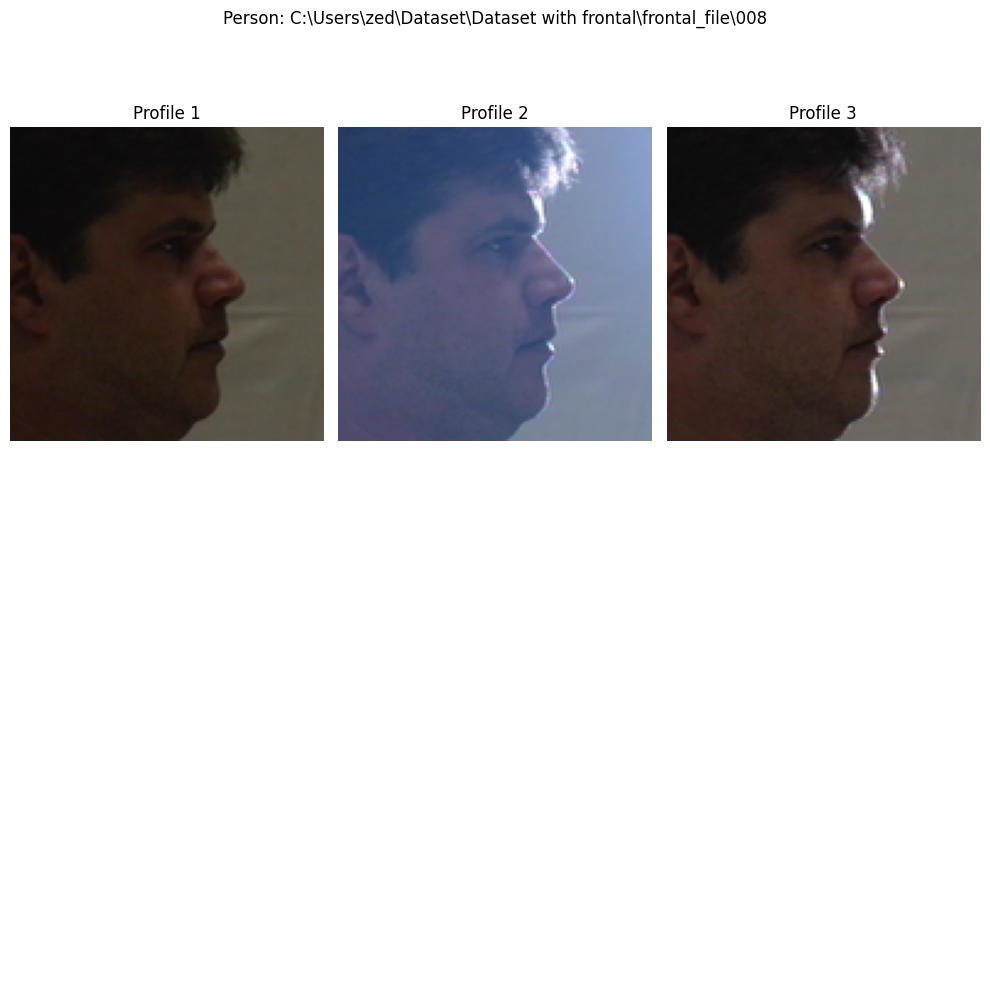

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\009\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\009\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\009\\frontal_128']


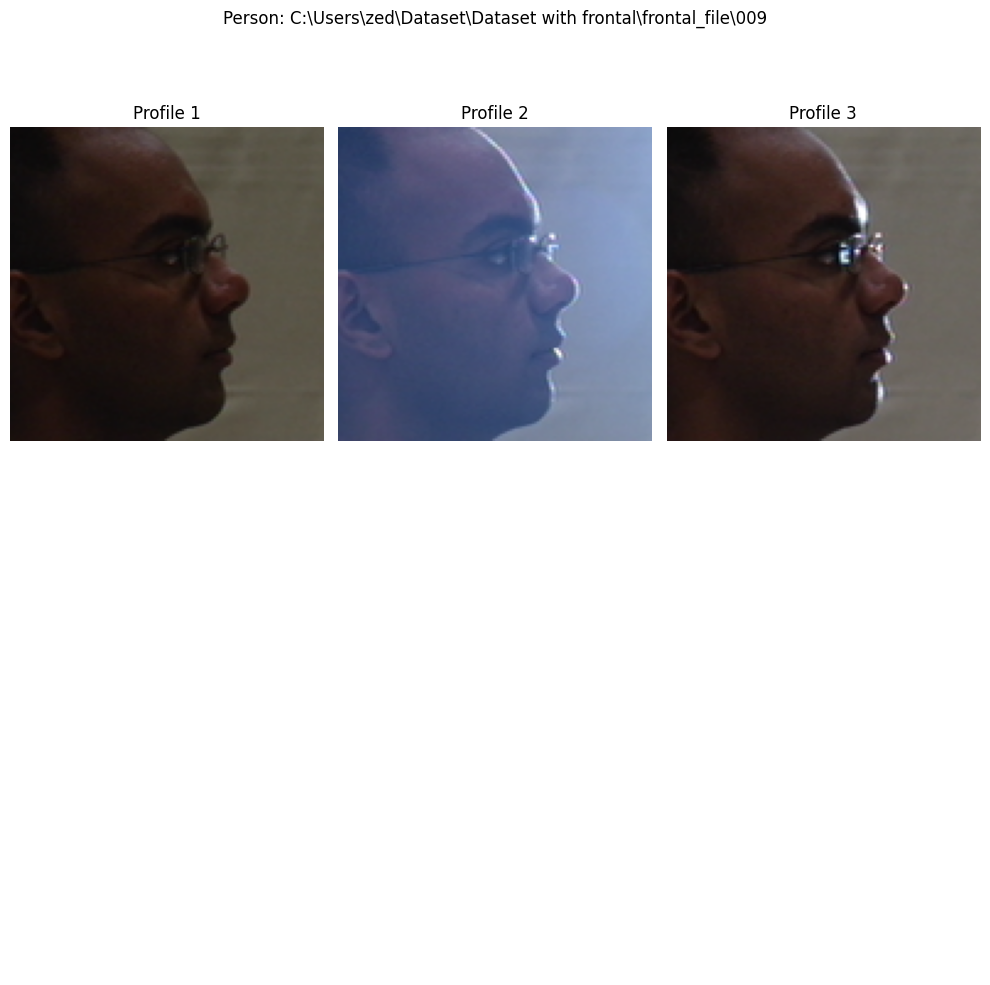

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\010\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\010\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\010\\frontal_128']


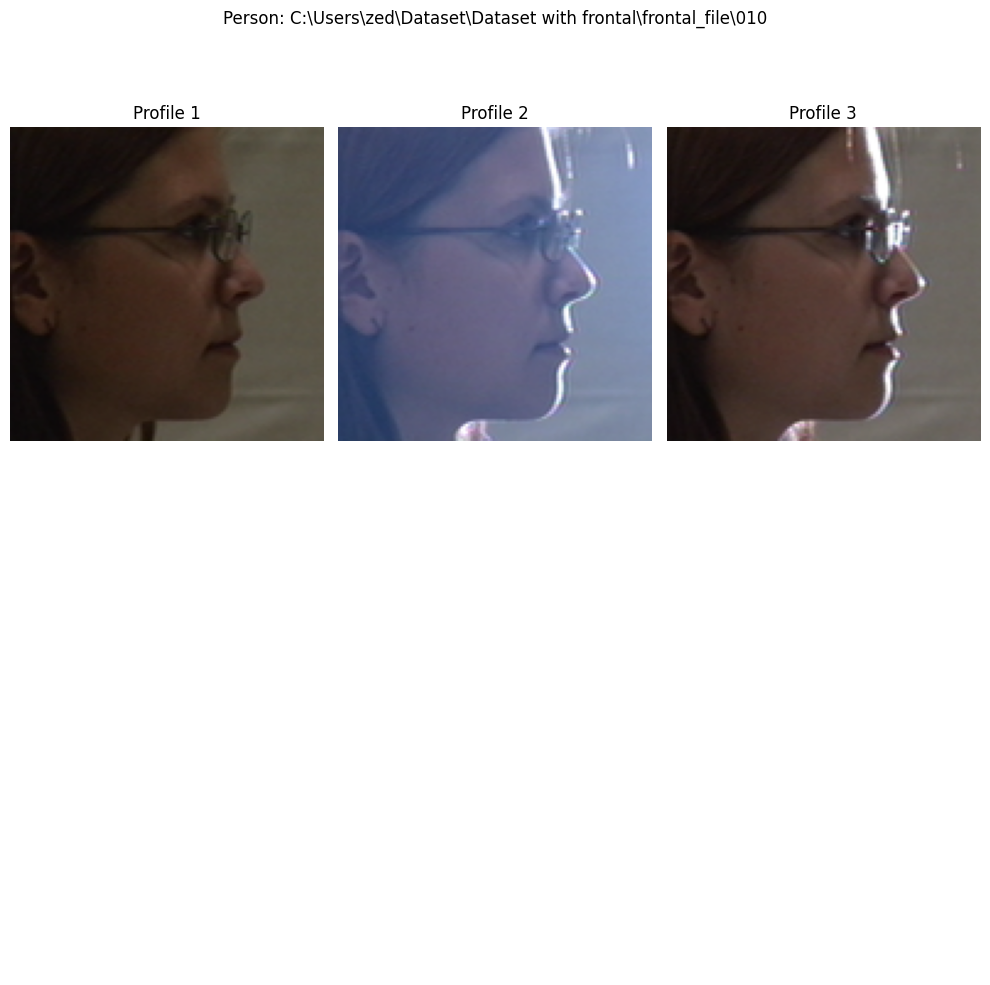

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\011\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\011\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\011\\frontal_128']


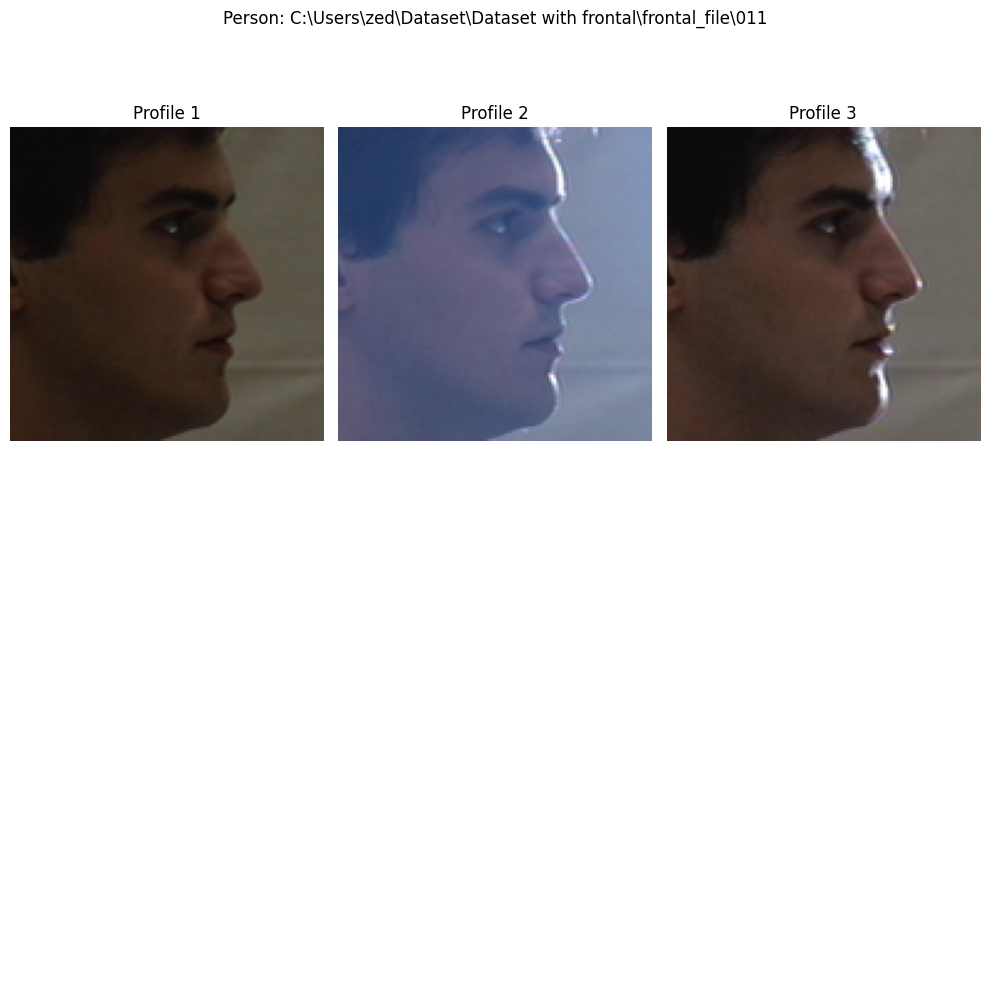

['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\012\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\012\\frontal_128', 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\012\\frontal_128']


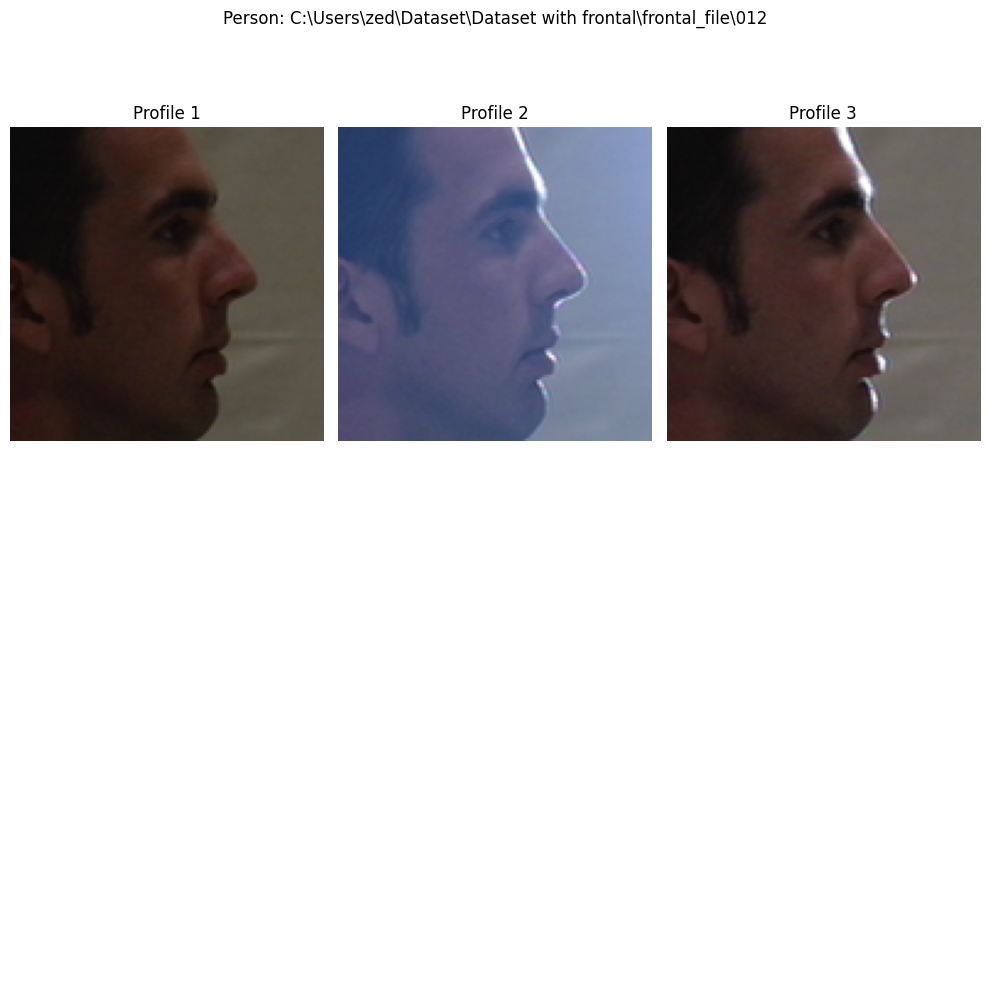

In [73]:
import matplotlib.pyplot as plt
import glob  # Import glob module for wildcard searches
#from your_dataset_path import ExternalInputIterator  # Replace with your actual dataset path

# Define number of profile images to display
num_profile_images = 3

# Create ExternalInputIterator object
dataset_path = r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file"  # Replace with your actual dataset path
iterator = ExternalInputIterator(dataset_path, batch_size =1)

for person_dir in iterator.person_dirs:
  # Get profile image paths
  profile_files = [f for f in os.listdir(person_dir) if f.endswith((".jpg", ".jpeg", ".png"))][:num_profile_images]

  # Find corresponding frontal image paths (based on naming convention)
  frontal_paths = [os.path.join(person_dir, f"frontal_{os.path.splitext(f)[0].split('_')[-1]}") for f in profile_files]
 
  # Handle cases with missing frontal images (optional)
  num_images_to_display = min(len(profile_files), len(frontal_paths))
  if num_images_to_display < len(profile_files):
    print(f"Warning: Missing frontal images for some profiles in {person_dir}")

  # Load and display images
  fig, axes = plt.subplots(2, num_images_to_display, figsize=(10, 10))  # Adjust figsize as needed

  for i in range(num_images_to_display):
    profile_path = os.path.join(person_dir, profile_files[i])
    profile_img = plt.imread(profile_path)
    axes[0, i].imshow(profile_img)
    axes[0, i].set_title(f"Profile {i+1}")
    axes[0, i].axis("off")

    if i < len(frontal_paths):  # Check if frontal image exists
      frontal_path = frontal_paths[i]
      if os.path.exists(frontal_path):  # Check if file exists before loading
        frontal_img = plt.imread(frontal_path)
        axes[1, i].imshow(frontal_img)
        axes[1, i].set_title(f"Frontal {i+1}")
        axes[1, i].axis("off")
      else:
        axes[1, i].axis("off")  # Hide subplot if frontal image missing

  # Remove extra empty subplots (if any)
  for j in range(num_images_to_display, 2):
    axes[1, j].axis("off")

  # Display the figure
  plt.suptitle(f"Person: {person_dir.split('/')[-1]}")  # Get person name from directory name
  plt.tight_layout()
  plt.show()
  plt.close(fig)


12
C:\Users\zed\Dataset\Dataset with frontal\frontal_file\frontal_001.png
482
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  7  7  7  7  7  7
  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7 

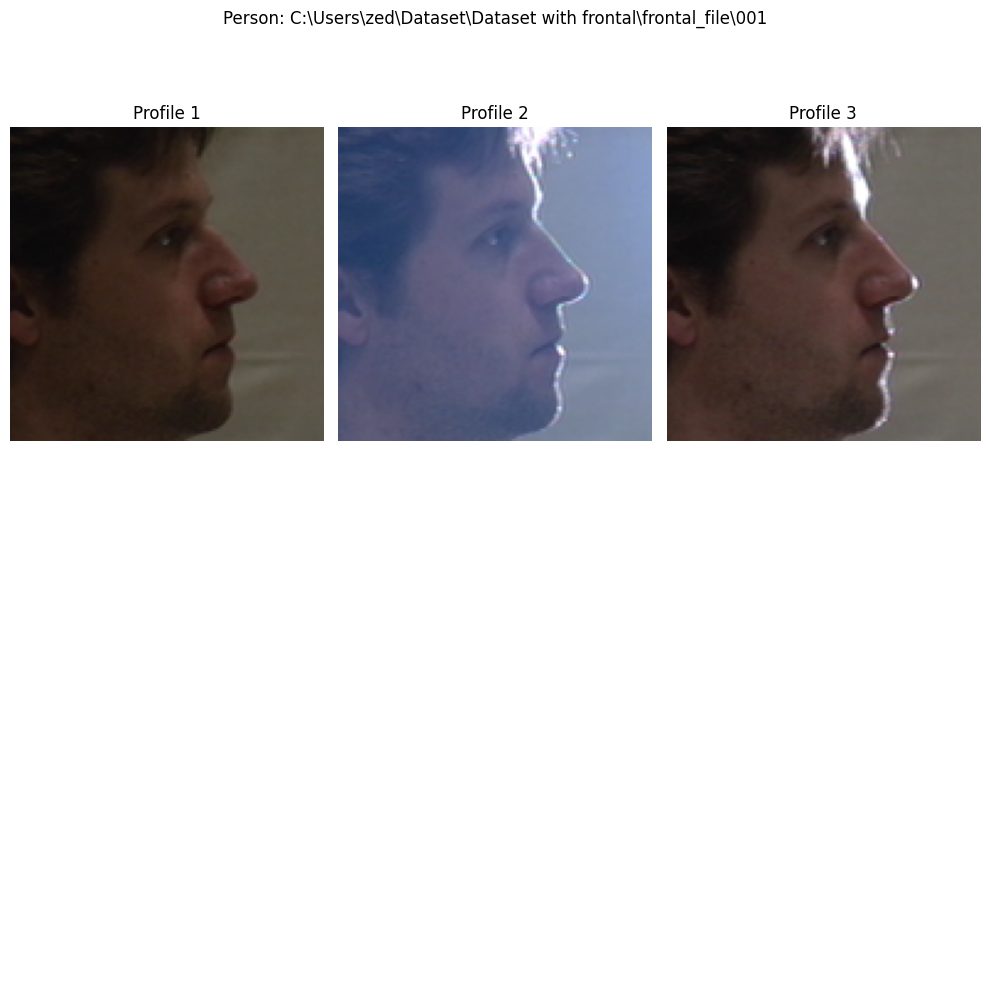

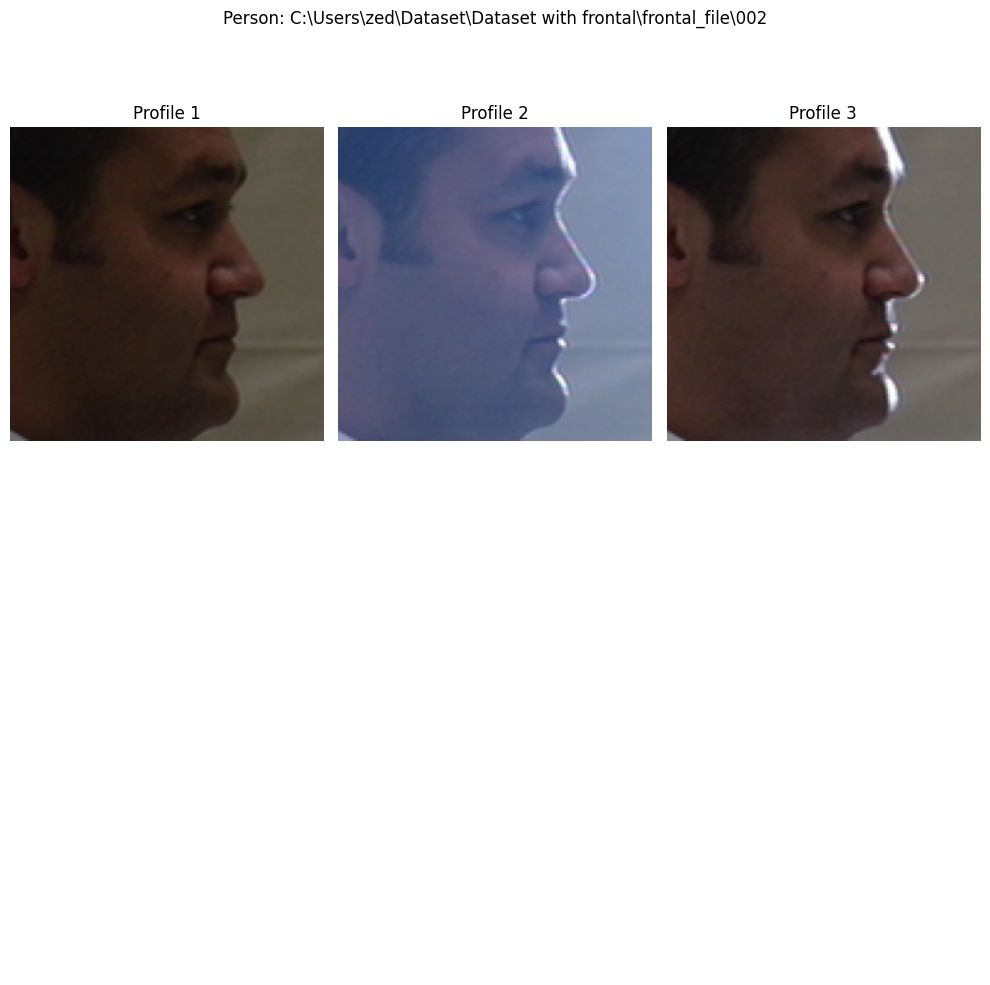

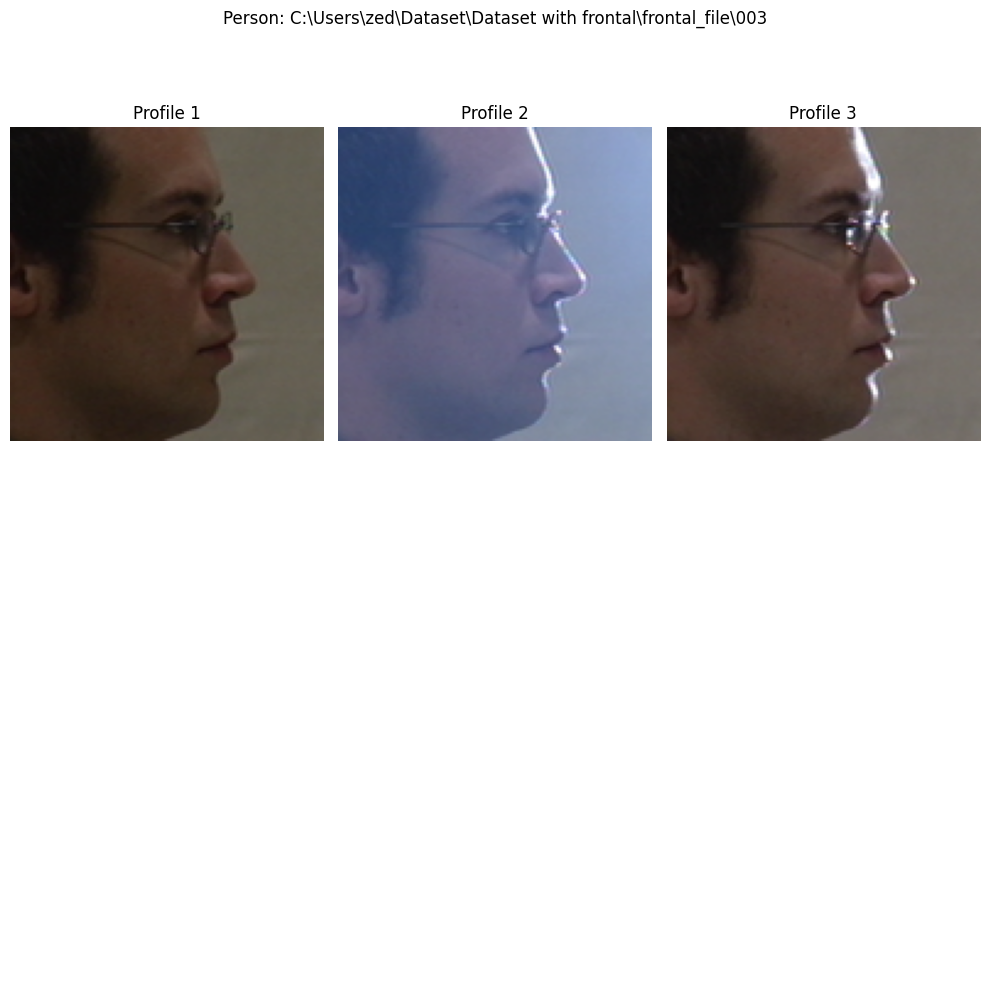

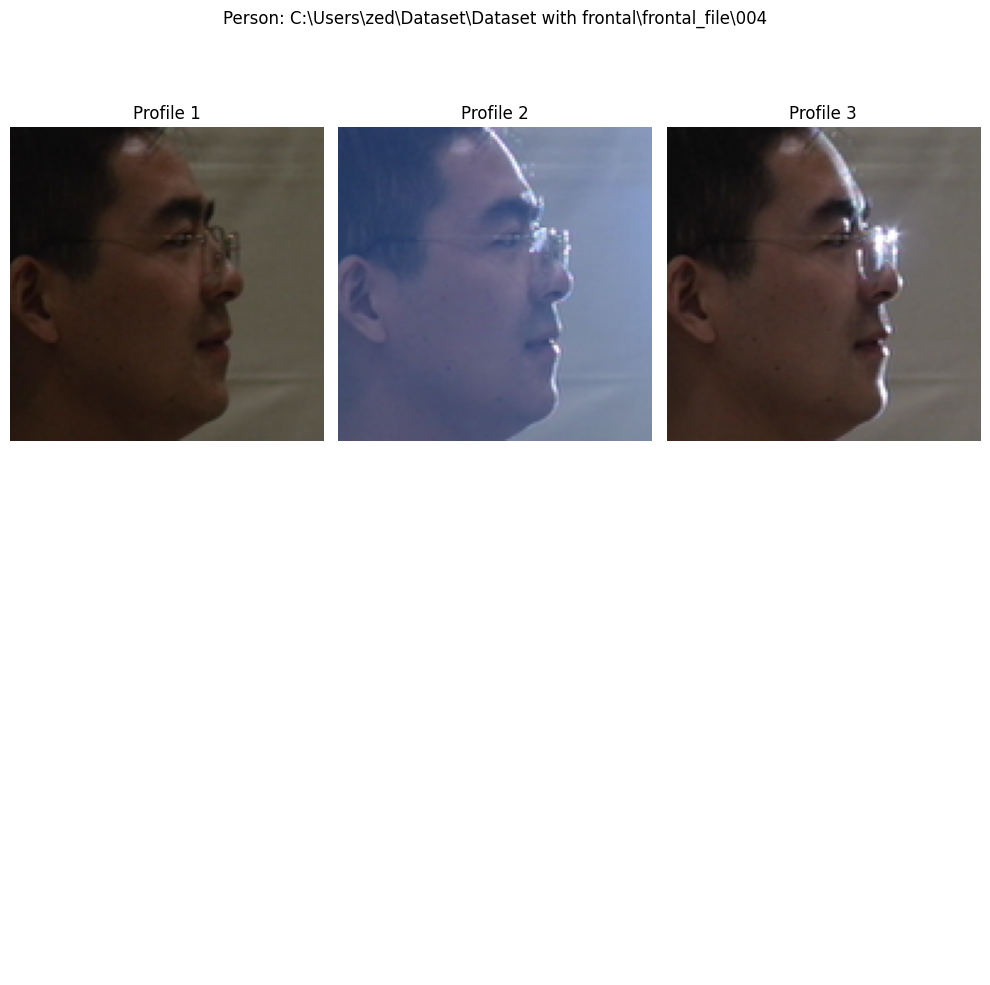

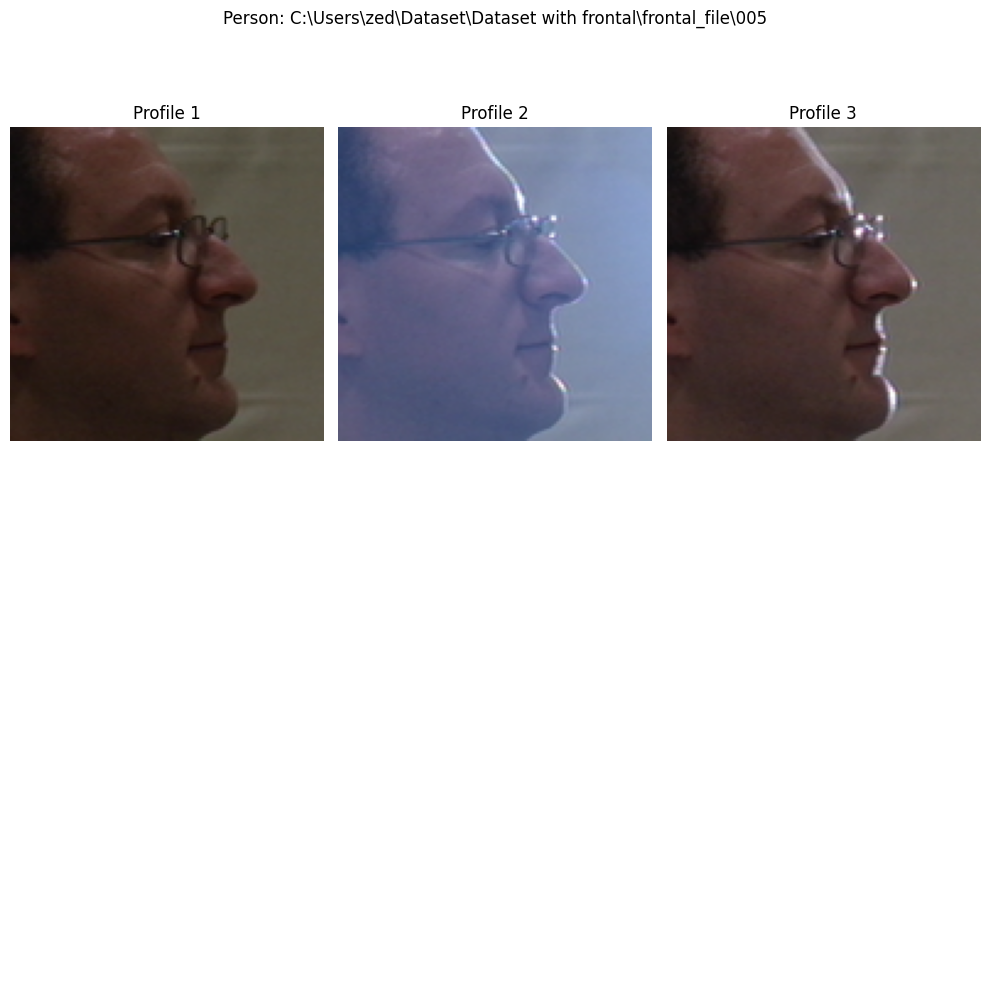

...

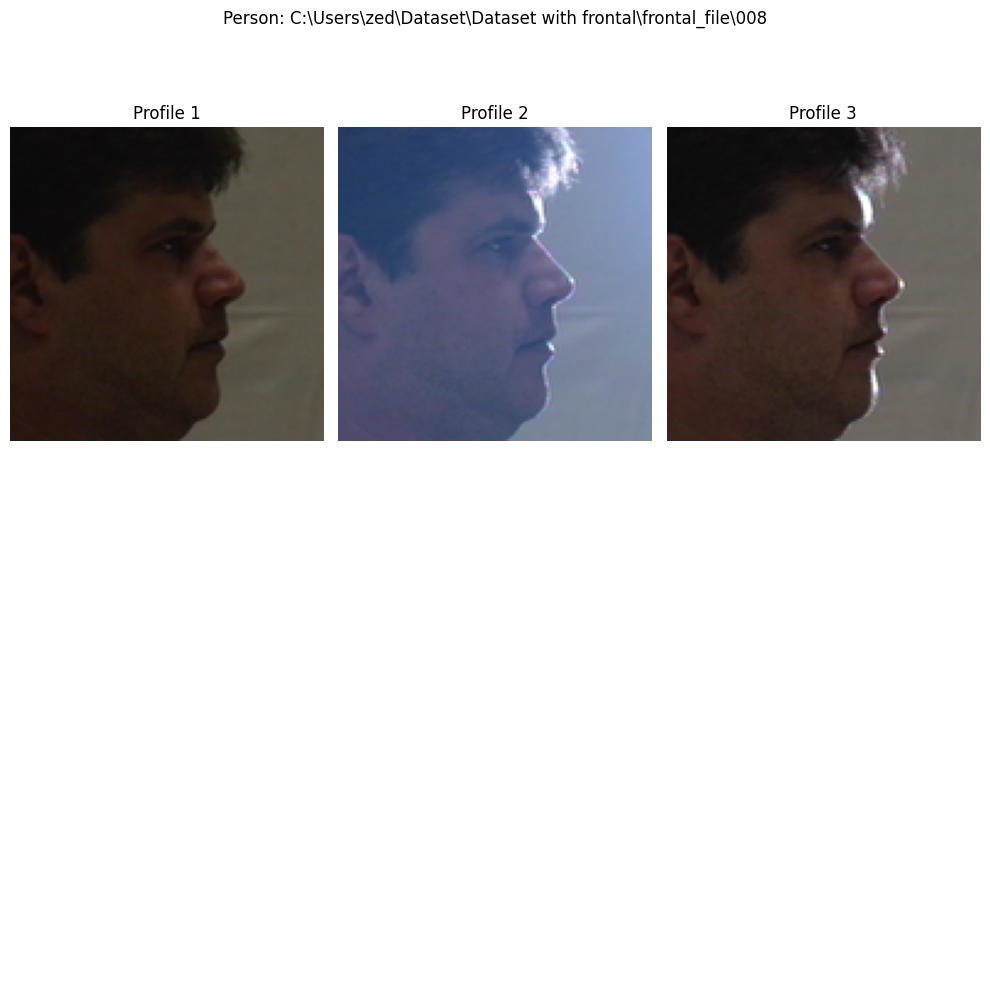

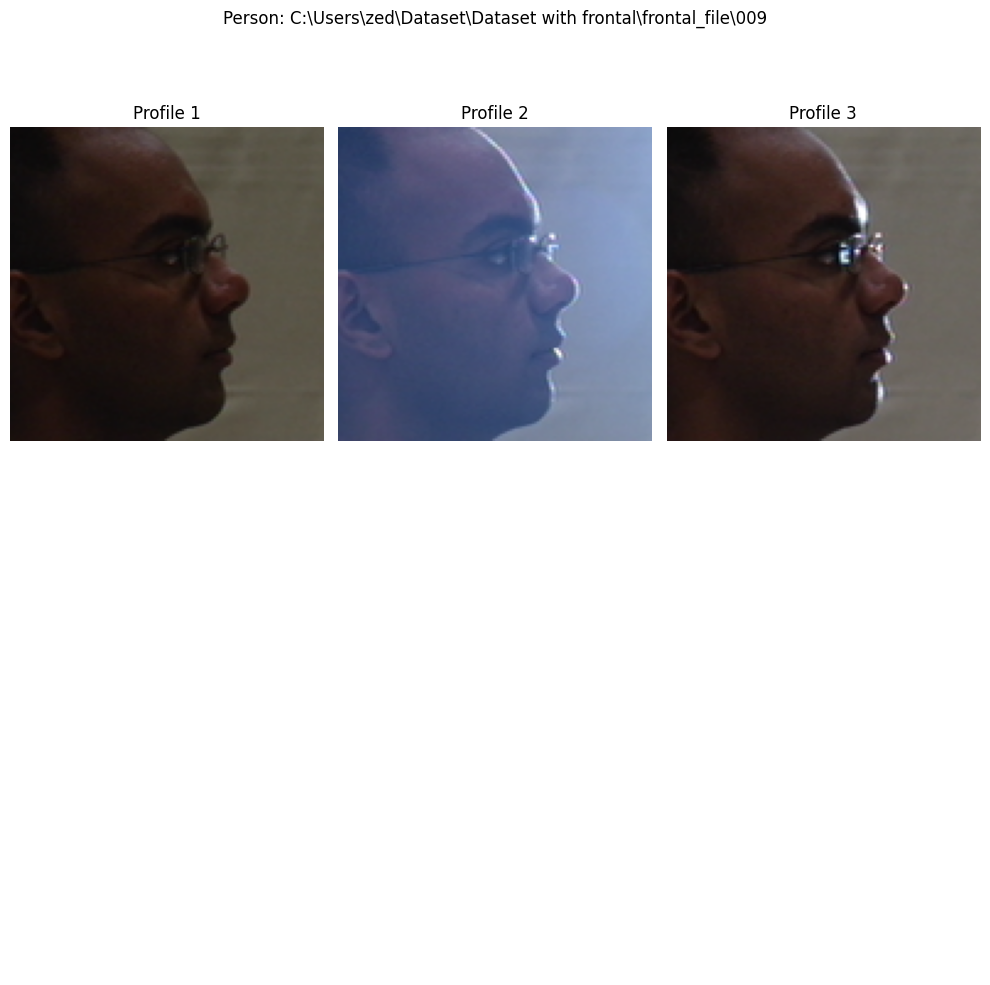

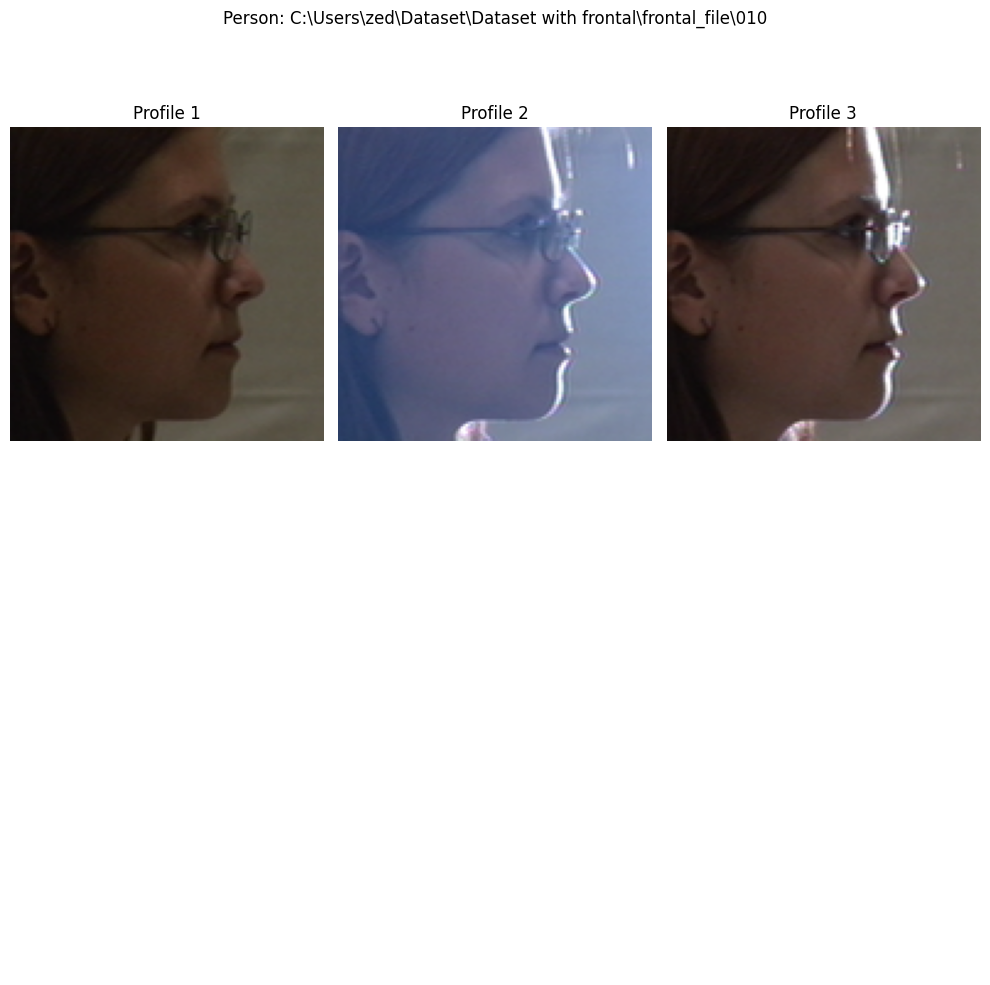

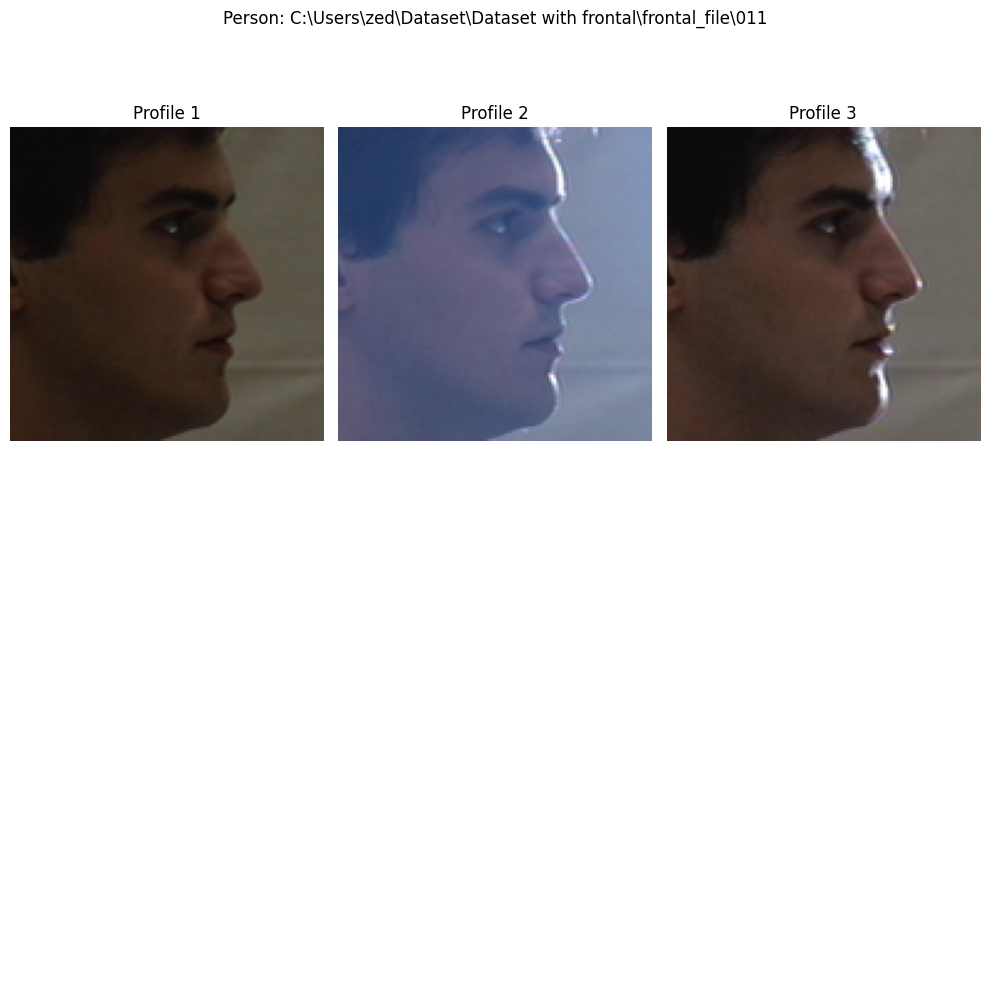

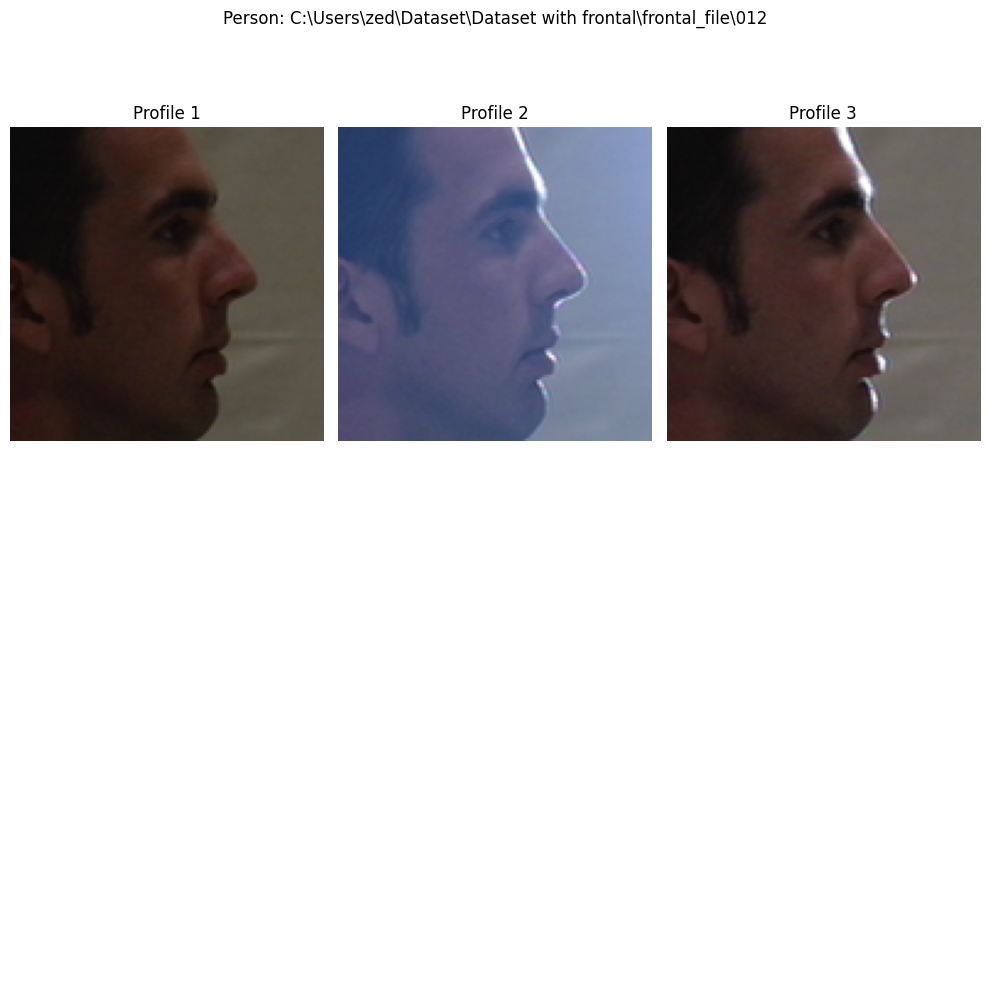

In [75]:
import matplotlib.pyplot as plt
import glob  # Import glob module for wildcard searches
#from your_dataset_path import ExternalInputIterator  # Replace with your actual dataset path

# Define number of profile images to display
num_profile_images = 3

# Create ExternalInputIterator object
dataset_path = r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file"  # Replace with your actual dataset path
iterator = ExternalInputIterator(dataset_path,batch_size = 1)

for person_dir in iterator.person_dirs:
  # Get profile image paths
  profile_files = [f for f in os.listdir(person_dir) if f.endswith((".jpg", ".jpeg", ".png"))][:num_profile_images]

  # Find corresponding frontal image paths (based on naming convention)
  frontal_paths = [os.path.join(person_dir, f"frontal_{os.path.splitext(f)[0].split('_')[-1]}") for f in profile_files]

  # Handle cases with missing frontal images (optional)
  num_images_to_display = min(len(profile_files), len(frontal_paths))
  if num_images_to_display < len(profile_files):
    print(f"Warning: Missing frontal images for some profiles in {person_dir}")

  # Load and display images
  fig, axes = plt.subplots(2, num_images_to_display, figsize=(10, 10))  # Adjust figsize as needed

  for i in range(num_images_to_display):
    profile_path = os.path.join(person_dir, profile_files[i])
    profile_img = plt.imread(profile_path)
    axes[0, i].imshow(profile_img)
    axes[0, i].set_title(f"Profile {i+1}")
    axes[0, i].axis("off")

    if i < len(frontal_paths):  # Check if frontal image exists
      frontal_path = frontal_paths[i]
      if os.path.exists(frontal_path):  # Check if file exists before loading
        frontal_img = plt.imread(frontal_path)
        axes[1, i].imshow(frontal_img)
        axes[1, i].set_title(f"Frontal {i+1}")
        axes[1, i].axis("off")
      else:
        axes[1, i].axis("off")  # Hide subplot if frontal image missing
    else:
      axes[1, i].axis("off")  # Hide subplot if exceeding number of frontal images

  # Remove extra empty subplots (if any)
  for j in range(num_images_to_display, 2):
    axes[1, j].axis("off")

  # Display the figure
  plt.suptitle(f"Person: {person_dir.split('/')[-1]}")  # Get person name from directory name
  plt.tight_layout()
  plt.show()
  plt.close(fig)


Frontal: 120
['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_00_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_01_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_05_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_06_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_09_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_12_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_13_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_14_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with fronta

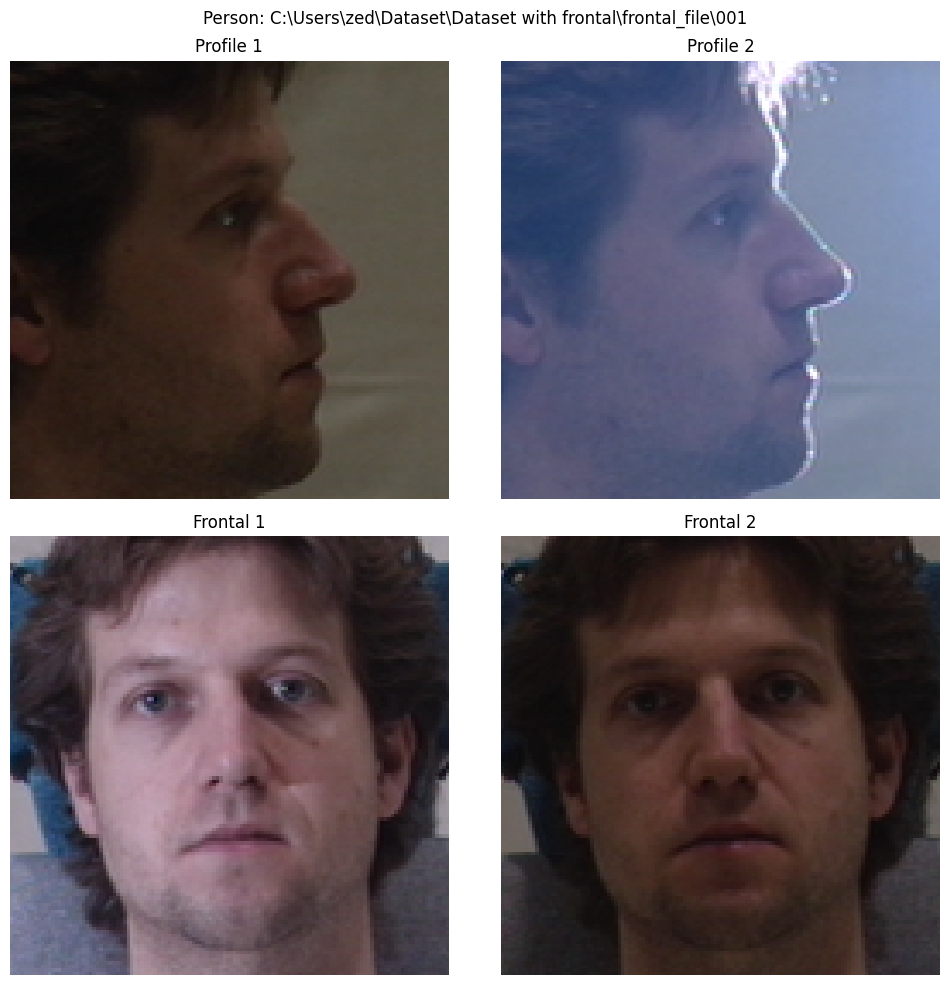

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\002
axes shape: (2, 2)
axes shape: (2, 2)


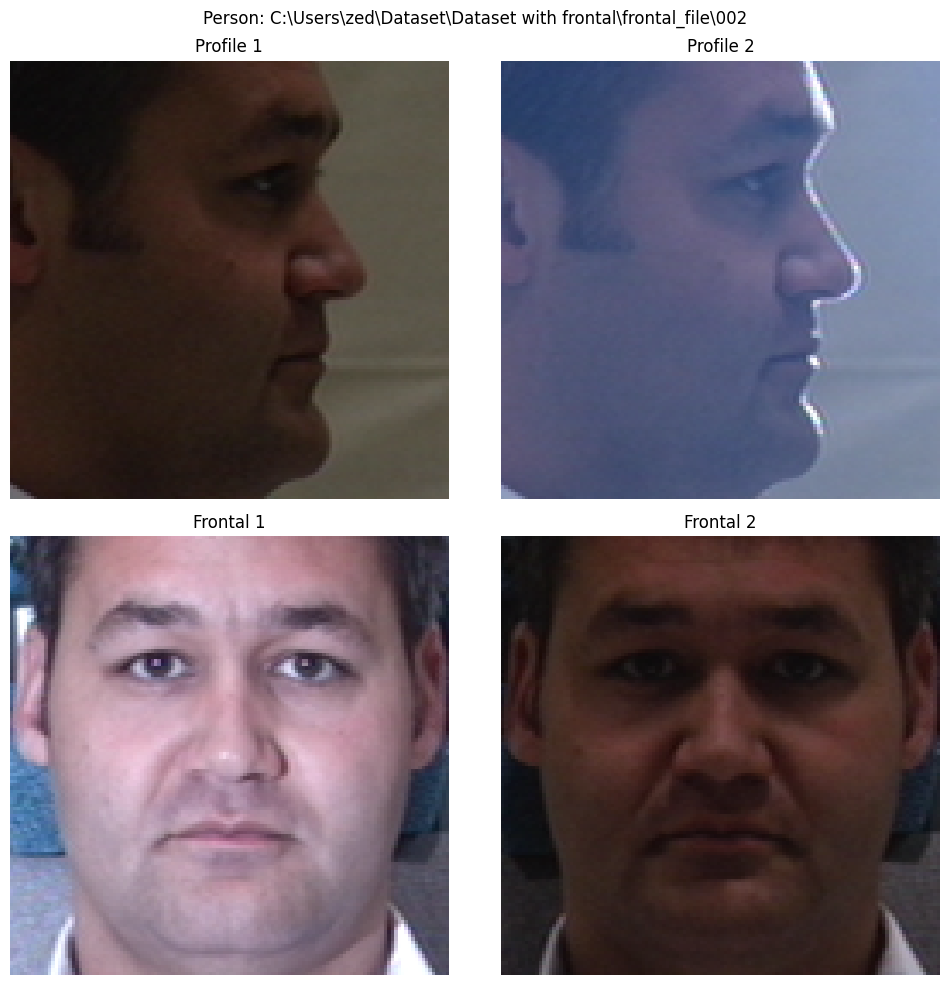

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\003
axes shape: (2, 2)
axes shape: (2, 2)


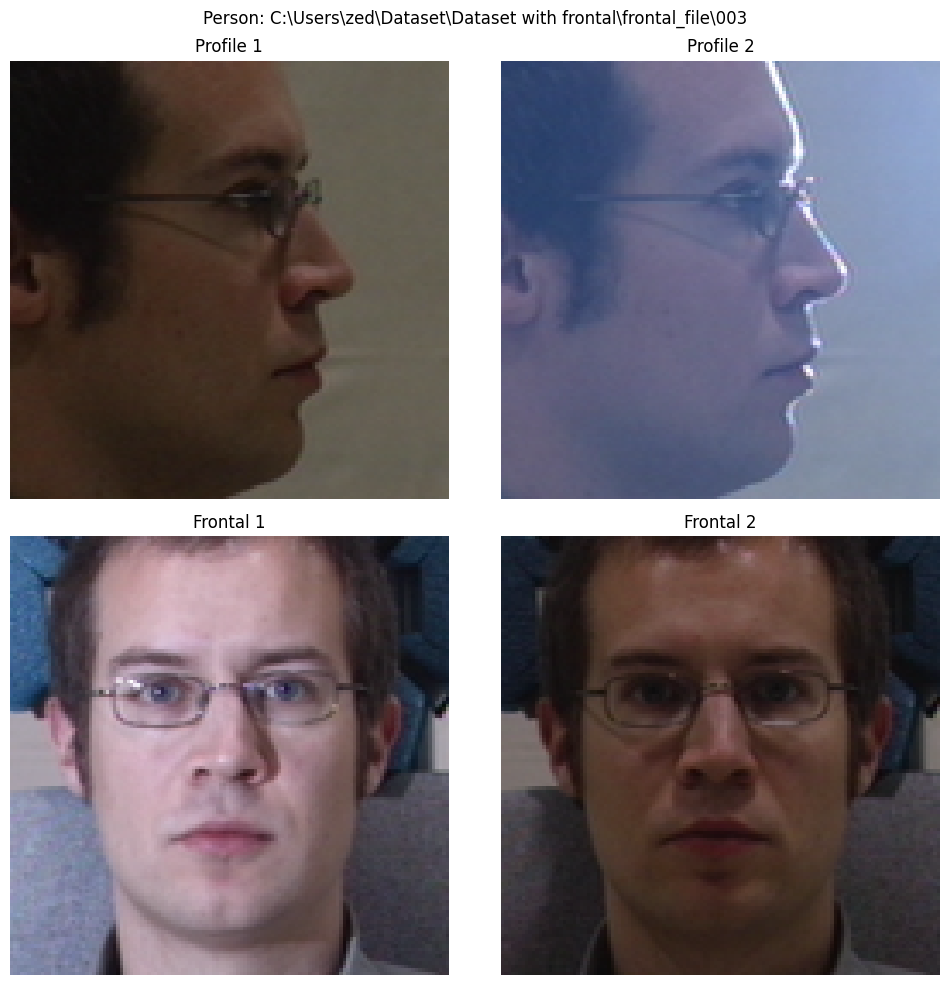

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\004
axes shape: (2, 2)
axes shape: (2, 2)


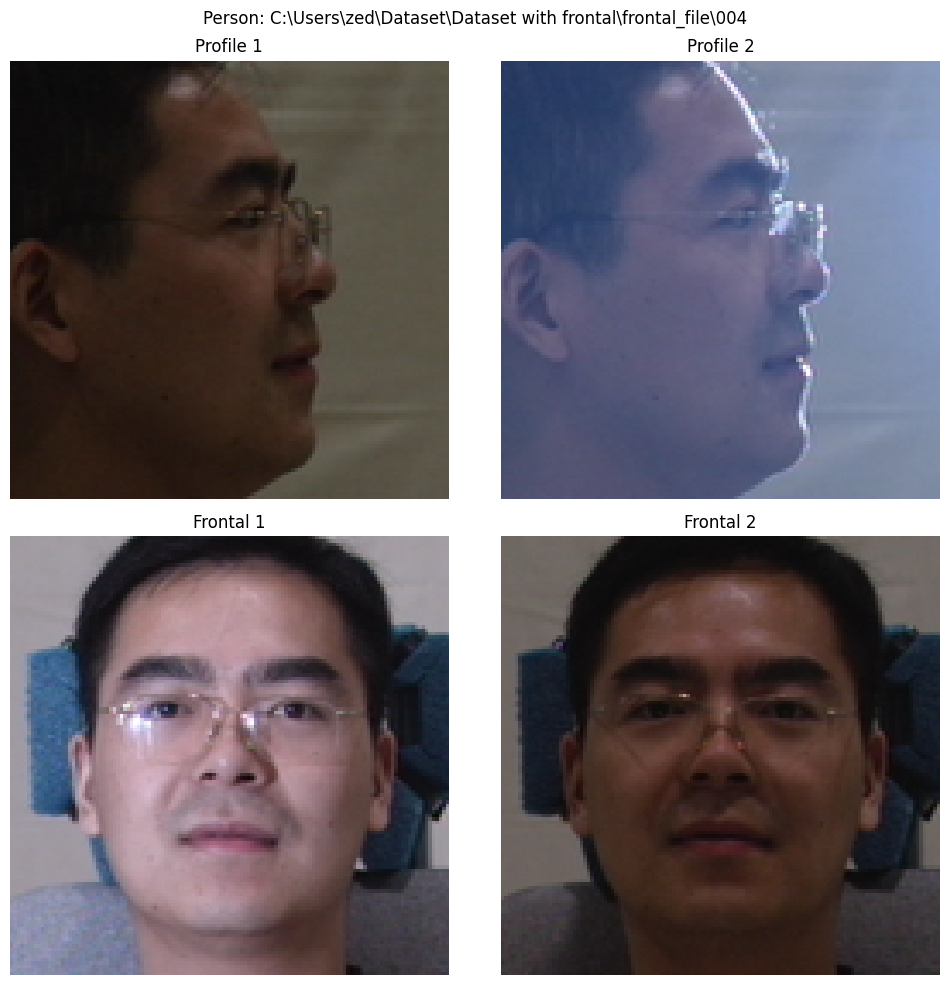

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\005
axes shape: (2, 2)
axes shape: (2, 2)


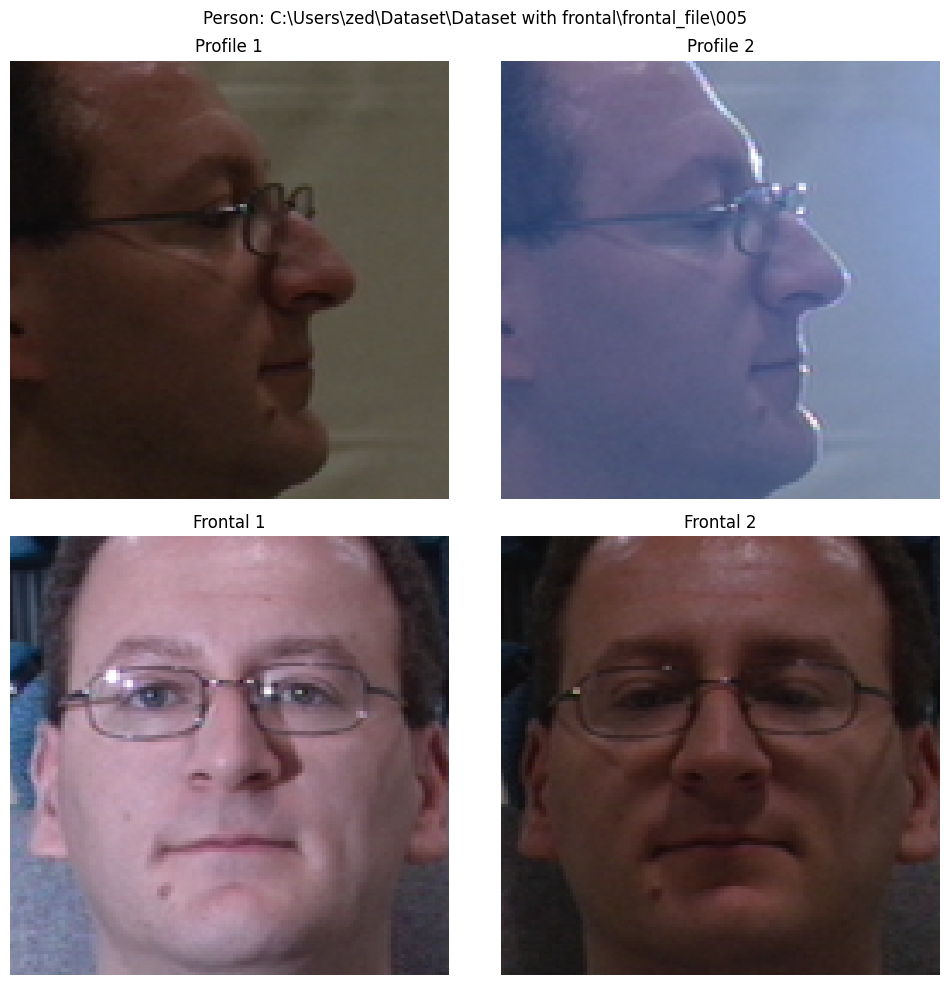

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\006
axes shape: (2, 2)
axes shape: (2, 2)


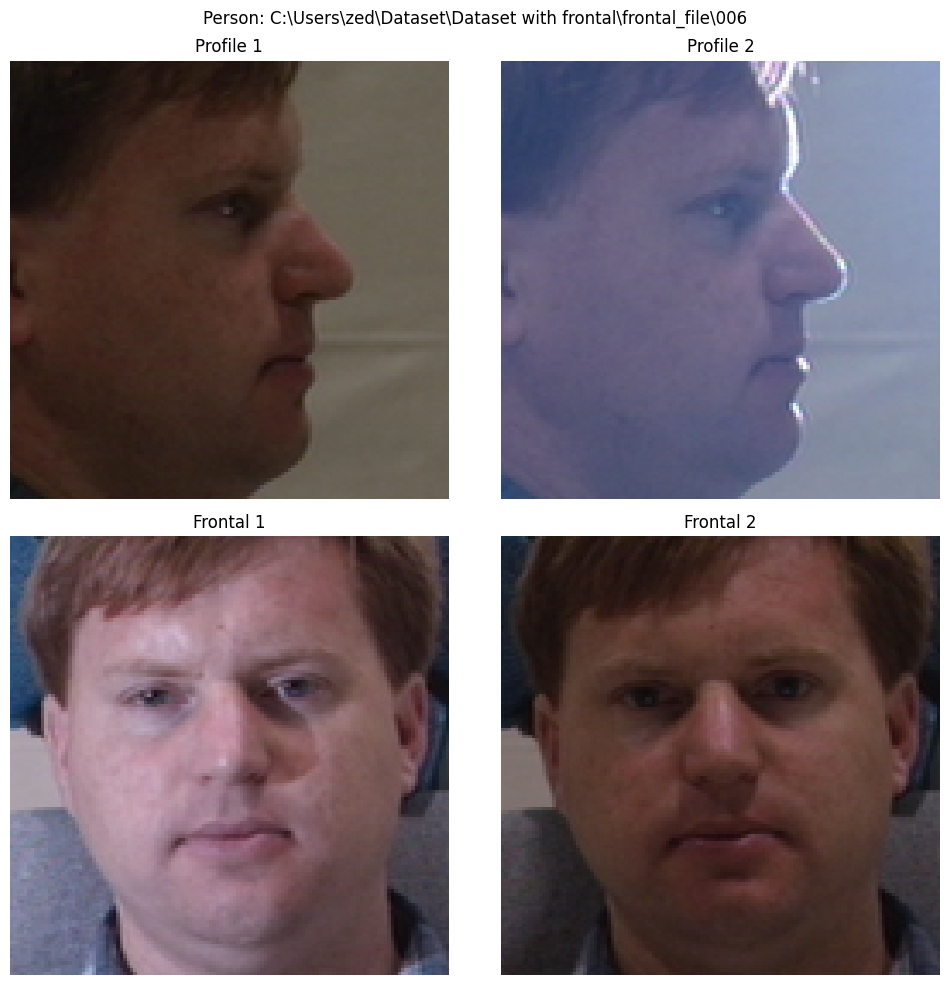

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\007
axes shape: (2, 2)
axes shape: (2, 2)


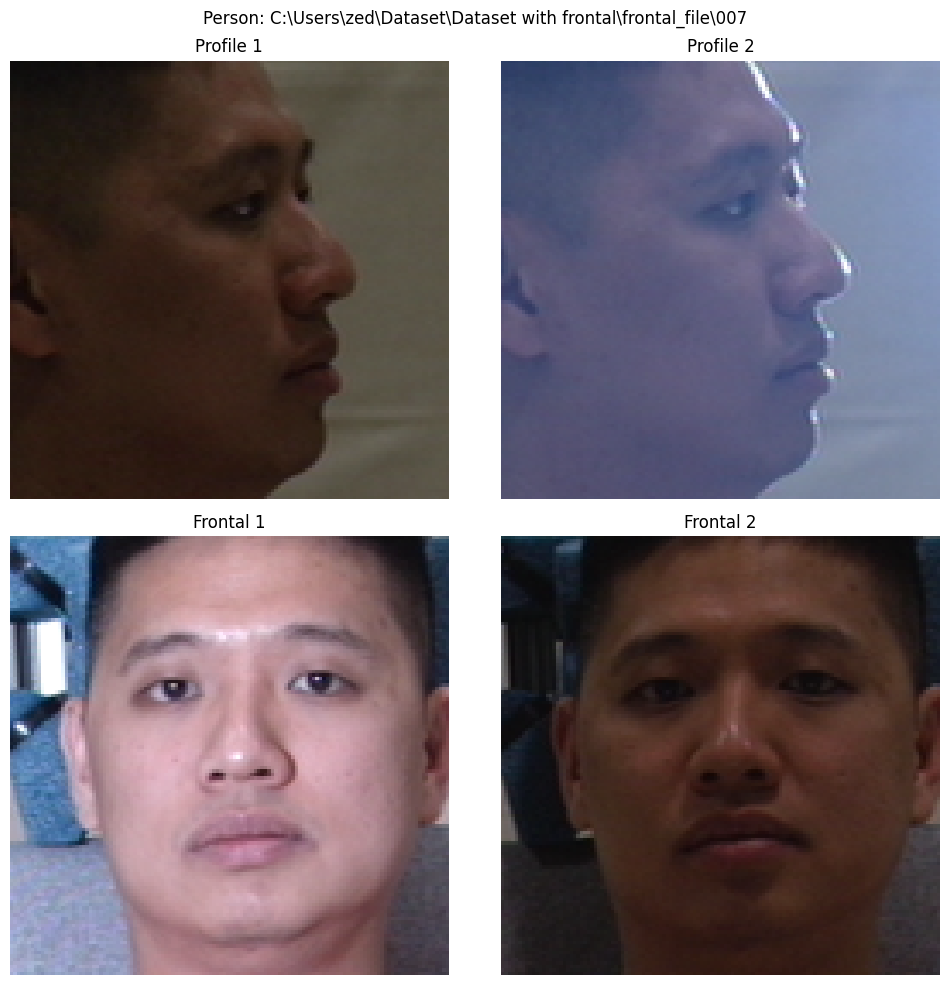

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\008
axes shape: (2, 2)
axes shape: (2, 2)


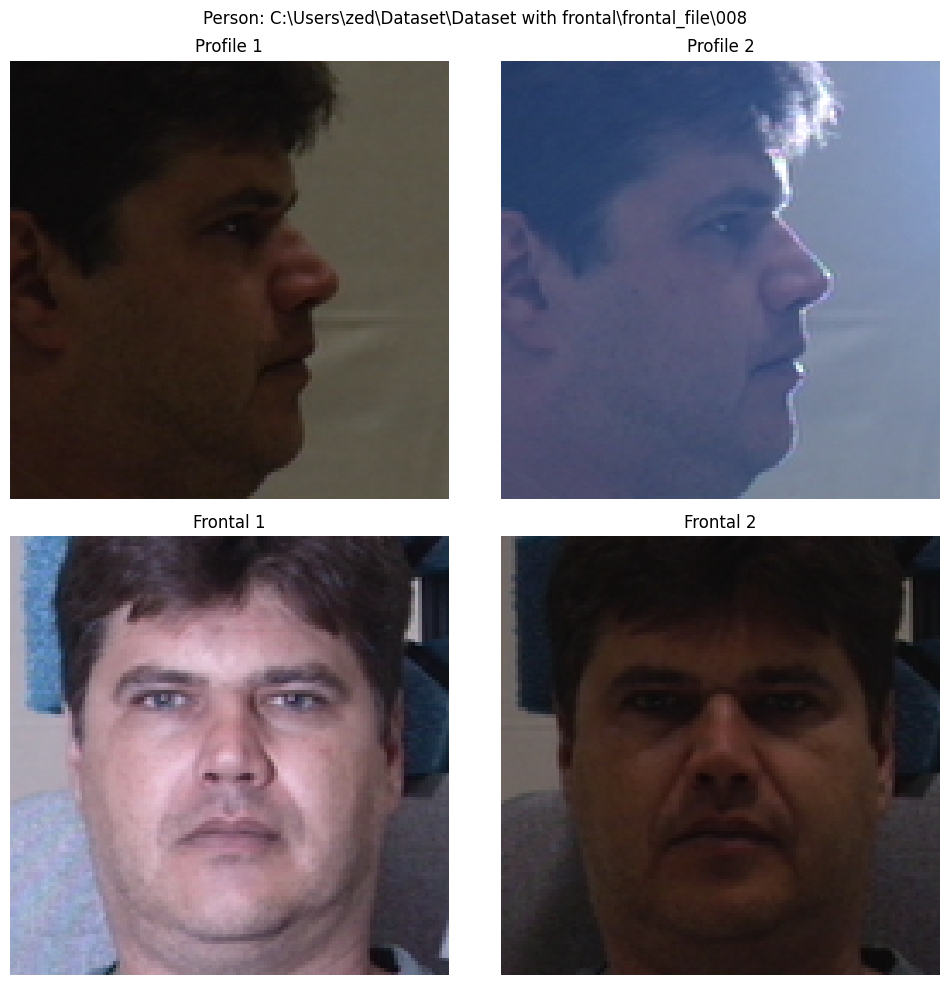

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\009
axes shape: (2, 2)
axes shape: (2, 2)


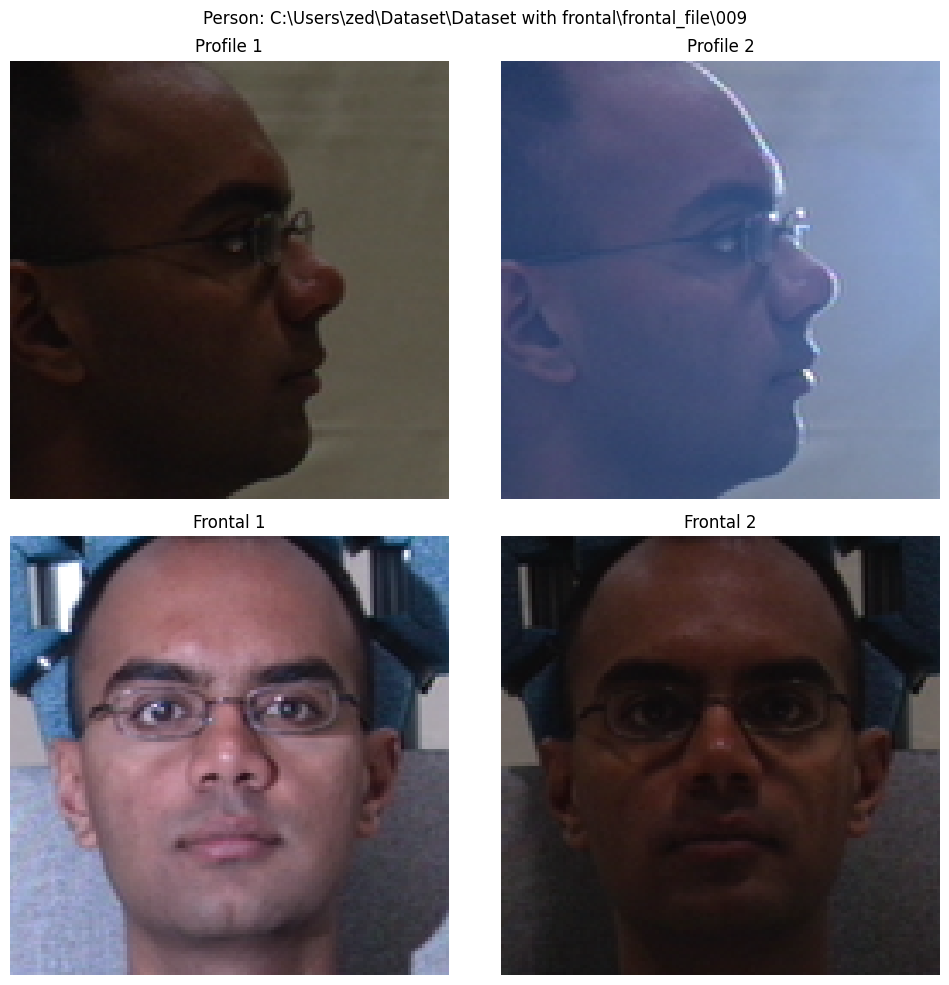

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\010
axes shape: (2, 2)
axes shape: (2, 2)


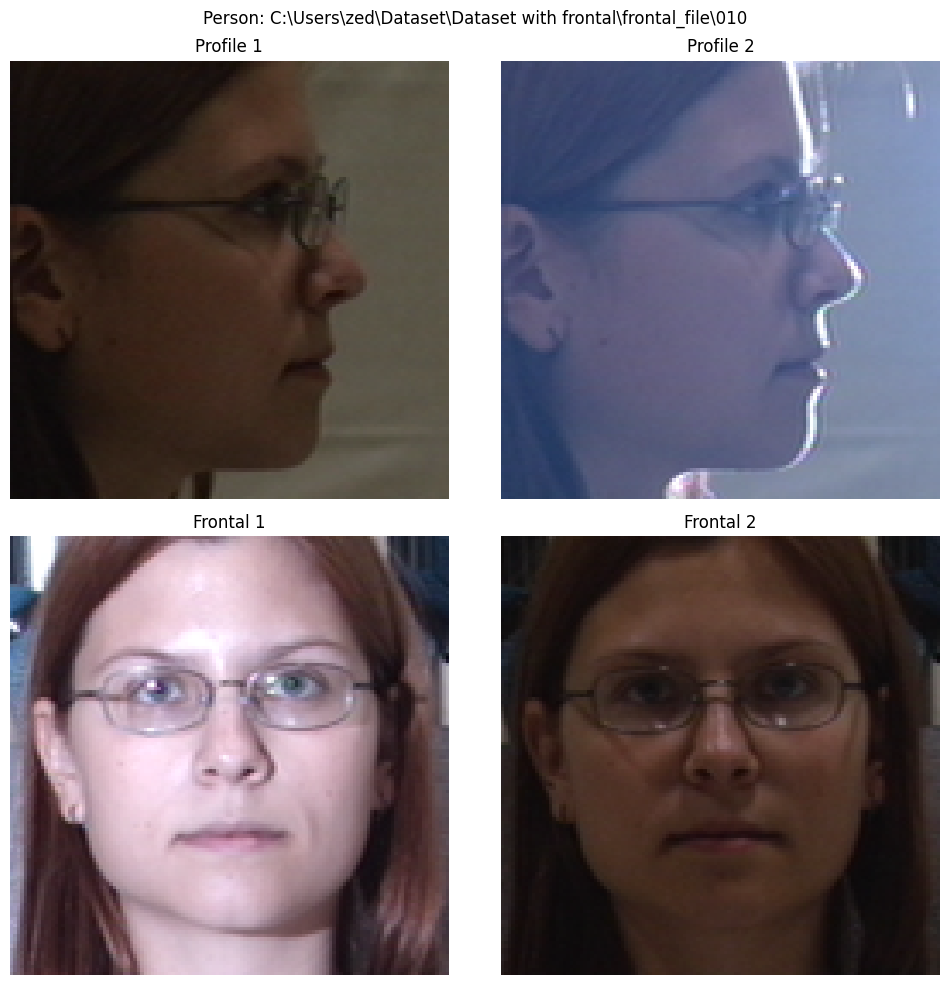

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\011
axes shape: (2, 2)
axes shape: (2, 2)


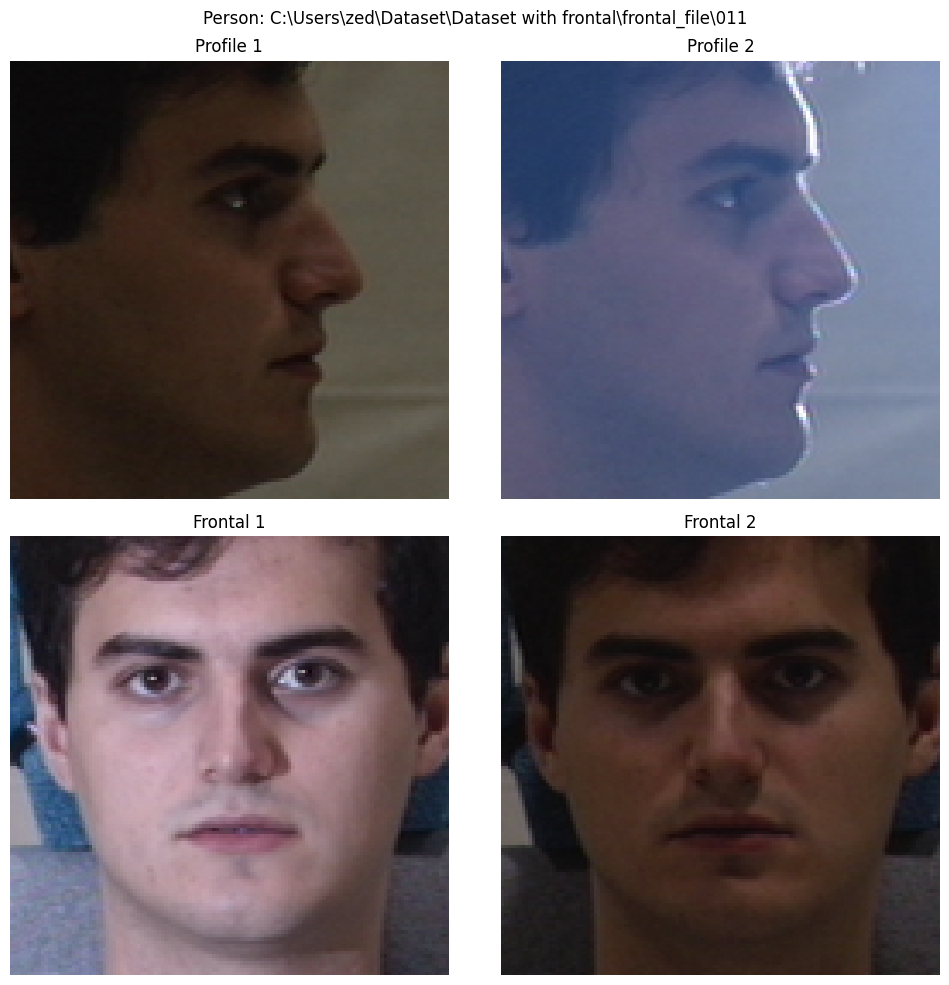

C:\Users\zed\Dataset\Dataset with frontal\frontal_file\012
axes shape: (2, 2)
axes shape: (2, 2)


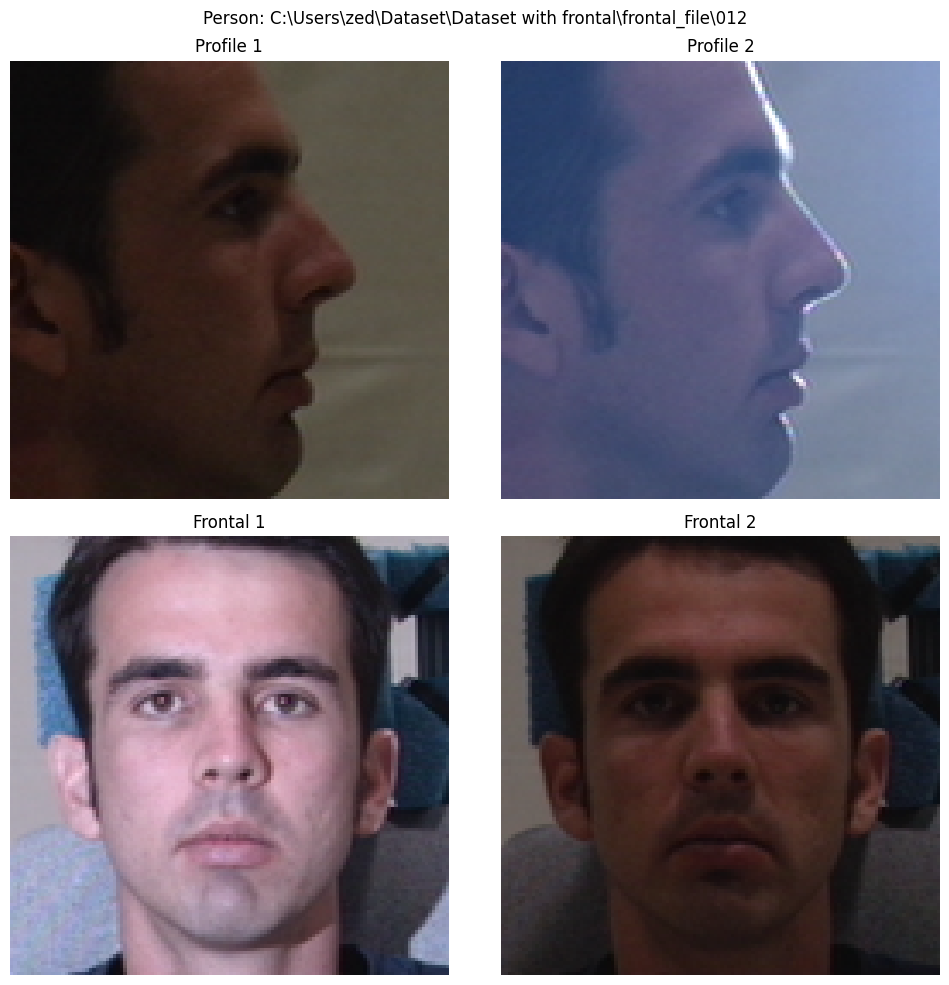

In [24]:
import matplotlib.pyplot as plt
import glob  # Import glob module for wildcard searches
#from your_dataset_path import ExternalInputIterator  # Replace with your actual dataset path

# Define number of profile images to display
num_profile_images = 3

# Create ExternalInputIterator object
dataset_path = r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file"  # Replace with your actual dataset path
iterator = ExternalInputIterator(dataset_path,batch_size=1)

for person_dir in iterator.person_dirs:
  # Get profile image paths (excluding frontal images)
  print(person_dir)
  All_files = [f for f in os.listdir(person_dir) 
                   if f.endswith(".png")]# and not f.startswith("frontal_")
  #print(f"All_files:{All_files}")
  

  # Find corresponding frontal image paths (based on naming convention)
  #frontal_paths = [f for f in os.listdir(person_dir) 
                   #if f.endswith(".png") and f.startswith("frontal_")]
 
  frontal_paths = [os.path.join(person_dir, f) for f in All_files if f.startswith("frontal_")]
  
  #print(f"Frontal path:{frontal_paths}")

  profile_files = [f for f in os.listdir(person_dir) 
                   if f.endswith(".png")and not f.startswith("frontal_")]
  profile_files = profile_files[:num_profile_images]  # Limit to desired number
  #print(f"profile_files: {profile_files}")
    #for f in profile_files:
      #print(f"files with out frontal image: {f}")
  #print(frontal_paths)
  # Handle cases with missing frontal images (optional)
  num_images_to_display = min(len(profile_files), len(frontal_paths))
  #print(num_images_to_display)
  if num_images_to_display < len(profile_files):
    print(f"Warning: Missing frontal images for some profiles in {person_dir}")

  # Load and display images
  fig, axes = plt.subplots(2, 2, figsize=(10, 10))  # Adjust figsize as needed

  for i in range(2):
    profile_path = os.path.join(person_dir, profile_files[i])
    profile_img = plt.imread(profile_path)
    print(f"axes shape: {axes.shape}")

    axes[0, i].imshow(profile_img)
    axes[0, i].set_title(f"Profile {i+1}")
    axes[0, i].axis("off")

    if i < len(frontal_paths):  # Check if frontal image exists
      frontal_path = frontal_paths[i]
      frontal_img = plt.imread(frontal_path)
      axes[1, i].imshow(frontal_img)
      axes[1, i].set_title(f"Frontal {i+1}")
      axes[1, i].axis("off")
    else:
      axes[1, i].axis("off")  # Hide subplot if frontal image missing

  # Remove extra empty subplots (if any)
  for j in range(num_images_to_display, 2):
    axes[1, j].axis("off")

  # Display the figure
  plt.suptitle(f"Person: {person_dir.split('/')[-1]}")  # Get person name from directory name
  plt.tight_layout()
  plt.show()
  plt.close(fig)


In [ ]:
import matplotlib.pyplot as plt
import glob  # Import glob module for wildcard searches
#from your_dataset_path import ExternalInputIterator  # Replace with your actual dataset path

# Define number of profile images to display
num_profile_images = 3

# Create ExternalInputIterator object
dataset_path = r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file"  # Replace with your actual dataset path
iterator = ExternalInputIterator(dataset_path,batch_size=1)

for person_dir in iterator.person_dirs:
  # Get profile image paths (excluding frontal images)
  print(person_dir)
  All_files = [f for f in os.listdir(person_dir) 
                   if f.endswith(".png")]# and not f.startswith("frontal_")
  #print(f"All_files:{All_files}")
  

  # Find corresponding frontal image paths (based on naming convention)
  #frontal_paths = [f for f in os.listdir(person_dir) 
                   #if f.endswith(".png") and f.startswith("frontal_")]
 
  frontal_paths = [os.path.join(person_dir, f) for f in All_files if f.startswith("frontal_")]
  
  #print(f"Frontal path:{frontal_paths}")

  profile_files = [f for f in os.listdir(person_dir) 
                   if f.endswith(".png")and not f.startswith("frontal_")]
  profile_files = profile_files[:num_profile_images]  # Limit to desired number
  #print(f"profile_files: {profile_files}")
    #for f in profile_files:
      #print(f"files with out frontal image: {f}")
  #print(frontal_paths)
  # Handle cases with missing frontal images (optional)
  num_images_to_display = min(len(profile_files), len(frontal_paths))
  #print(num_images_to_display)
  if num_images_to_display < len(profile_files):
    print(f"Warning: Missing frontal images for some profiles in {person_dir}")

  # Load and display images
  fig, axes = plt.subplots(2, 2, figsize=(10, 10))  # Adjust figsize as needed

  for i in range(2):
    profile_path = os.path.join(person_dir, profile_files[i])
    profile_img = plt.imread(profile_path)
    print(f"axes shape: {axes.shape}")

    axes[0, i].imshow(profile_img)
    axes[0, i].set_title(f"Profile {i+1}")
    axes[0, i].axis("off")

    if i < len(frontal_paths):  # Check if frontal image exists
      frontal_path = frontal_paths[i]
      frontal_img = plt.imread(frontal_path)
      axes[1, i].imshow(frontal_img)
      axes[1, i].set_title(f"Frontal {i+1}")
      axes[1, i].axis("off")
    else:
      axes[1, i].axis("off")  # Hide subplot if frontal image missing

  # Remove extra empty subplots (if any)
  for j in range(num_images_to_display, 2):
    axes[1, j].axis("off")

  # Display the figure
  plt.suptitle(f"Person: {person_dir.split('/')[-1]}")  # Get person name from directory name
  plt.tight_layout()
  plt.show()
  plt.close(fig)


**Try 2**

In [43]:
import collections
from random import shuffle
import os
from os import listdir
from os.path import join

import numpy as np
from PIL import Image  # Import PIL for image decoding


def is_jpeg(filename):
    # You can customize this function to match your preferred file extension(s)
    return any(filename.endswith(extension) for extension in [".jpg", ".jpeg", ".png"])


"""def get_subdirs(directory):
    # Ensure both "frontal_file" and "profile_file" folders exist
    subdirs = [
        d
        for d in sorted(os.listdir(directory))
        if os.path.isdir(os.path.join(directory, d))
        and all(
            os.path.isdir(os.path.join(d, subfolder))
            for subfolder in ["frontal_file", "profile_file"]
        )
    ]
    return sorted(subdirs)"""
def get_subdirs(directory):
    subdirs = sorted([join(directory, name) for name in sorted(os.listdir(directory)) if os.path.isdir(os.path.join(directory, name))])
    return subdirs



flatten = lambda l: [item for sublist in l for item in sublist]


class ExternalInputIterator:
    def __init__(self, imageset_dir, batch_size, random_shuffle=False):
        self.imageset_dir = imageset_dir
        self.batch_size = batch_size

        # Get subdirectories (assuming "frontal_file" and "profile_file" folders exist)
        self.person_dirs = get_subdirs(imageset_dir)
        self.front = 0
        self.prof = 0
        #for person_dir in iterator.person_dirs:
  # Get profile image paths (excluding frontal images)
        #print(person_dirs)
        """self.frontals = []
          self.All_files = [f for f in os.listdir(person_dir) 
                   if f.endswith(".png")]# and not f.startswith("frontal_")
          self.frontal = [os.path.join(person_dir, f) for f in self.All_files if f.startswith("frontal_")]
          for f in self.All_files:
              if f.startswith("frontal_"):
                  self.frontals.append(self.frontal)"""
        """self.profile_files = [f for f in os.listdir(person_dir) 
                   if f.endswith(".png")and not f.startswith("frontal_")]
          self.prof += len(self.profile_files )"""

        
        #print(self.prof)
        # Collect frontal image paths (adjust according to your data structure)
        """self.frontals = np.array(
            [join(imageset_dir, frontal_file) for frontal_file in sorted(os.listdir(imageset_dir)) if is_jpeg(frontal_file)]
        )
        print(len(self.frontals))"""
        

        self.All_files = [
            [
                join(person_dir, profile_file)
                for profile_file in os.listdir(person_dir)
                if is_jpeg(profile_file) 
            ]
            for person_dir in self.person_dirs
        ]
        self.All_files = np.array(flatten(self.All_files))
        print(len(self.All_files))

        self.frontals = [
            [
                join(person_dir, profile_file)
                for profile_file in os.listdir(person_dir)
                if is_jpeg(profile_file) and  profile_file.startswith("frontal_")
            ]
            for person_dir in self.person_dirs
        ]

        self.frontals = np.array(flatten(self.frontals))
        print(f"Frontal: {len(self.frontals)}")
        print(self.frontals)
        
        # Collect profile image paths (adjust according to your data structure)
        self.profile_files = [
            [
                join(person_dir, profile_file)
                for profile_file in os.listdir(person_dir)
                if is_jpeg(profile_file) and not profile_file.startswith("frontal_")
            ]
            for person_dir in self.person_dirs
        ]
        #print(len(self.profile_files))

        # Create a flattened list of frontal indices
        """self.frontal_indices = np.array(
            [i for i, profiles in enumerate(self.profile_files) for _ in profiles]
        )"""

        self.frontal_indices = np.array(
            [i for i, profiles in enumerate(self.All_files) for _ in profiles]
        )
        print(len(self.frontal_indices))
        print(self.frontal_indices[:300])

        # Flatten profile_files for easier access
        self.profiles = np.array(flatten(self.profile_files))
        print(len(self.profiles ))

        # Shuffle if necessary
        if random_shuffle:
            """ind = np.array(range(len(self.frontal_indices)))
            shuffle(ind)
            self.profiles = self.profiles[ind]
            self.frontal_indices = self.frontal_indices[ind]"""
            ind = np.array(range(len(self.frontal_indices)))
            shuffle(ind)
            self.profiles = self.profiles[ind.astype(int)]
            self.frontal_indices = self.frontal_indices[ind.astype(int)]


        self.i = 0
        self.n = len(self.frontal_indices)

    def __iter__(self):
        return self

    def __next__(self):
        profiles = []
        frontals = []

        for _ in range(self.batch_size):
            profile_filename = self.profiles[self.i]
            frontal_filename = self.frontals[self.frontal_indices[self.i]]
            #frontal_filename = self.frontals[self.i]
            #print(f"frontal_filename: {len(frontal_filename)}")

            with Image.open(profile_filename) as profile_img:
                profiles.append(np.array(profile_img))
            with Image.open(frontal_filename) as frontal_img:
                frontals.append(np.array(frontal_img))

            self.i = (self.i + 1) % self.n

        return (profiles, frontals)

class ImagePipeline:
    def __init__(self, imageset_dir, image_size=128, random_shuffle=False, batch_size=64, num_threads=2, device_id=0):
        self.eii = ExternalInputIterator(imageset_dir, batch_size, random_shuffle)
        self.iterator = iter(self.eii)
        self.num_inputs = len(self.eii.frontal_indices)
        self.image_size = image_size

    def epoch_size(self, name=None):
        return self.num_inputs

    def __len__(self):
        return self.num_inputs

    def __iter__(self):
        return self

    def __next__(self):
        (images, targets) = next(self.iterator)

        # Perform resizing and normalization using NumPy
        resized_images = np.array([np.array(Image.fromarray(img).resize((self.image_size, self.image_size))) for img in images])
        resized_targets = np.array([np.array(Image.fromarray(target).resize((self.image_size, self.image_size))) for target in targets])

        # Normalize using mean and standard deviation
        normalized_images = (resized_images - 128.0) / 128.0
        normalized_targets = (resized_targets - 128.0) / 128.0

        return (normalized_images, normalized_targets)

    def __getitem__(self, index):  # Added __getitem__ method
        # Advance the iterator to the desired index
        for _ in range(index):
            next(self.iterator)

        # Return the next batch
        return next(self)


In [44]:
x = ExternalInputIterator(imageset_dir=r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file",batch_size=32)

1313
Frontal: 120
['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_00_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_01_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_05_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_06_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_09_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_12_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_13_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_14_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with f

In [26]:
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
from torch.autograd import Variable


def weights_init(m):
    classname = m.__class__.__name__
    
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)


''' Generator network for 128x128 RGB images '''
class G(nn.Module):
    
    def __init__(self):
        super(G, self).__init__()
        
        self.main = nn.Sequential(
            # Input HxW = 128x128
            nn.Conv2d(3, 16, 4, 2, 1), # Output HxW = 64x64
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, 4, 2, 1), # Output HxW = 32x32
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.Conv2d(32, 64, 4, 2, 1), # Output HxW = 16x16
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 128, 4, 2, 1), # Output HxW = 8x8
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.Conv2d(128, 256, 4, 2, 1), # Output HxW = 4x4
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.Conv2d(256, 512, 4, 2, 1), # Output HxW = 2x2
            nn.MaxPool2d((2,2)),
            # At this point, we arrive at our low D representation vector, which is 512 dimensional.

            nn.ConvTranspose2d(512, 256, 4, 1, 0, bias = False), # Output HxW = 4x4
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias = False), # Output HxW = 8x8
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias = False), # Output HxW = 16x16
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias = False), # Output HxW = 32x32
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 16, 4, 2, 1, bias = False), # Output HxW = 64x64
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 3, 4, 2, 1, bias = False), # Output HxW = 128x128
            nn.Tanh()
        )

    
    def forward(self, input):
        output = self.main(input)
        return output


''' Discriminator network for 128x128 RGB images '''
class D(nn.Module):
    
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                                  nn.Conv2d(3, 16, 4, 2, 1),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(16, 32, 4, 2, 1),
                                  nn.BatchNorm2d(32),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(32, 64, 4, 2, 1),
                                  nn.BatchNorm2d(64),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(64, 128, 4, 2, 1),
                                  nn.BatchNorm2d(128),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(128, 256, 4, 2, 1),
                                  nn.BatchNorm2d(256),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(256, 512, 4, 2, 1),
                                  nn.BatchNorm2d(512),
                                  nn.LeakyReLU(0.2, inplace = True),
                                  nn.Conv2d(512, 1, 4, 2, 1, bias = False),
                                  nn.Sigmoid()
                                  )
    
    
    def forward(self, input):
        output = self.main(input)
        return output.view(-1)

In [27]:
from __future__ import print_function
import time
import math
import random
import os
from os import listdir
from os.path import join
from PIL import Image

import numpy as np
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torchvision.utils as vutils
from torch.autograd import Variable
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm

#from nvidia.dali.plugin.pytorch import DALIGenericIterator

#from data import ImagePipeline
#import network

np.random.seed(42)
random.seed(10)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.manual_seed(999)
torch.cuda.manual_seed(999)
# Where is your training dataset at?
datapath = r"C:\Users\zed\Dataset\Dataset with frontal\frontal_file"

# You can also choose which GPU you want your model to be trained on below:
gpu_id = 0
device = torch.device("cuda", gpu_id)

"""train_pipe = ImagePipeline(datapath, image_size=128, random_shuffle=True, batch_size=30, device_id=gpu_id)
train_pipe.build()
m_train = train_pipe.epoch_size()
print("Size of the training set: ", m_train)
train_pipe_loader = DALIGenericIterator(train_pipe, ["profiles", "frontals"], m_train)"""
# Assuming you have the modified ImagePipeline class from the previous responses
train_pipe = ImagePipeline(datapath, image_size=128, random_shuffle=True, batch_size=32, device_id=gpu_id)
# No need to call build() without DALI

# Use a standard PyTorch DataLoader instead of DALIGenericIterator
#train_pipe_loader = DataLoader(train_pipe, batch_size=train_pipe.batch_size)
m_train = train_pipe.epoch_size()
#train_pipe_loader = DataLoader(train_pipe, batch_size=32,)
train_pipe_loader = DataLoader(train_pipe,)
# Generator:
#netG = network.G().to(device)
#netG.apply(network.weights_init)
netG = G().to(device)
netG.apply(weights_init)

# Discriminator:
#netD = network.D().to(device)
#netD.apply(network.weights_init)
netD = D().to(device)
netD.apply(weights_init)

# Here is where you set how important each component of the loss function is:
L1_factor = 0
L2_factor = 1
GAN_factor = 0.0005

criterion = nn.BCELoss() # Binary cross entropy loss

# Optimizers for the generator and the discriminator (Adam is a fancier version of gradient descent with a few more bells and whistles that is used very often):
optimizerD = optim.Adam(netD.parameters(), lr = 0.0002, betas = (0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr = 0.0002, betas = (0.5, 0.999), eps = 1e-8)

# Create a directory for the output files
try:
    os.mkdir('output')
except OSError:
    pass

start_time = time.time()

# Let's train for 30 epochs (meaning, we go through the entire training set 30 times):
for epoch in range(20):
    
    # Lets keep track of the loss values for each epoch:
    loss_L1 = 0
    loss_L2 = 0
    loss_gan = 0
    
    # Your train_pipe_loader will load the images one batch at a time
    # The inner loop iterates over those batches:
    print("starting...")
    with tqdm(total=len(train_pipe_loader), desc=f"Epoch {epoch+1}") as pbar:
        for i, data in enumerate(train_pipe_loader, 0):
        
        # These are your images from the current batch:
        #profile = data[0]['profiles']
        #frontal = data[0]['frontals']
            profile = data[0].view(32, 3, 128, 128)
            frontal = data[1].view(32, 3, 128, 128)
        
        
        # TRAINING THE DISCRIMINATOR
            netD.zero_grad()
            real = Variable(frontal).type('torch.FloatTensor').to(device)
            target = Variable(torch.ones(real.size()[0])).to(device)
            output = netD(real)
        # D should accept the GT images
            errD_real = criterion(output, target)
        
            profile = Variable(profile).type('torch.FloatTensor').to(device)
            generated = netG(profile)
            target = Variable(torch.zeros(real.size()[0])).to(device)
            output = netD(generated.detach()) # detach() because we are not training G here

            pbar.update(1)
        
        # D should reject the synthetic images
            errD_fake = criterion(output, target)
        
            errD = errD_real + errD_fake
            errD.backward()
        # Update D
            optimizerD.step()
        
        # TRAINING THE GENERATOR
            netG.zero_grad()
            target = Variable(torch.ones(real.size()[0])).to(device)
            output = netD(generated)
        
        # G wants to :
        # (a) have the synthetic images be accepted by D (= look like frontal images of people)
            errG_GAN = criterion(output, target)
        
        # (b) have the synthetic images resemble the ground truth frontal image
            errG_L1 = torch.mean(torch.abs(real - generated))
            errG_L2 = torch.mean(torch.pow((real - generated), 2))
        
            errG = GAN_factor * errG_GAN + L1_factor * errG_L1 + L2_factor * errG_L2
        
            loss_L1 += errG_L1.item()
            loss_L2 += errG_L2.item()
            loss_gan += errG_GAN.item()
        
            errG.backward()
        # Update G
            optimizerG.step()
    
    if epoch == 0:
        print('First training epoch completed in ',(time.time() - start_time),' seconds')
    if epoch > 0:
        print(f"Epoch: {epoch} is starting..")
    # reset the DALI iterator
    #train_pipe_loader.reset()

    # Print the absolute values of three losses to screen:
    print('[%d/30] Training absolute losses: L1 %.7f ; L2 %.7f BCE %.7f' % ((epoch + 1), loss_L1/m_train, loss_L2/m_train, loss_gan/m_train,))

    # Save the inputs, outputs, and ground truth frontals to files:
    vutils.save_image(profile.data, 'output/%03d_input.jpg' % epoch, normalize=True)
    vutils.save_image(real.data, 'output/%03d_real.jpg' % epoch, normalize=True)
    vutils.save_image(generated.data, 'output/%03d_generated.jpg' % epoch, normalize=True)

    

    # Save the pre-trained Generator as well
    torch.save(netG,'output/netG_%d.pt' % epoch)

Frontal: 120
['C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_00_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_01_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_05_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_06_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_09_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_12_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_13_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with frontal\\frontal_file\\001\\frontal_001_01_01_051_14_crop_128.png'
 'C:\\Users\\zed\\Dataset\\Dataset with fronta

Epoch 1: 100%|███████████████████████████████████████████████████████████████████| 1193/1193 [9:24:32<00:00, 28.39s/it]


First training epoch completed in  33872.12095236778  seconds
[1/30] Training absolute losses: L1 0.1202270 ; L2 0.0306251 BCE 4.6892605
starting...


Epoch 2: 100%|███████████████████████████████████████████████████████████████████| 1193/1193 [9:21:03<00:00, 28.22s/it]


Epoch: 1 is starting..
[2/30] Training absolute losses: L1 0.0725474 ; L2 0.0087891 BCE 3.8879961
starting...


Epoch 3: 100%|███████████████████████████████████████████████████████████████████| 1193/1193 [9:20:33<00:00, 28.19s/it]


Epoch: 2 is starting..
[3/30] Training absolute losses: L1 0.0700081 ; L2 0.0081400 BCE 4.0397210
starting...


Epoch 4:  11%|███████▋                                                              | 131/1193 [07:21<59:41,  3.37s/it]


KeyboardInterrupt: 

In [29]:
len(train_pipe_loader),len(train_pipe)

(1193, 1193)